# Self-Driving Car Engineer Nanodegree


## Project: **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

In addition to implementing code, there is a brief writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) that can be used to guide the writing process. Completing both the code in the Ipython notebook and the writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/322/view) for this project.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="examples/line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="examples/laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.**  

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


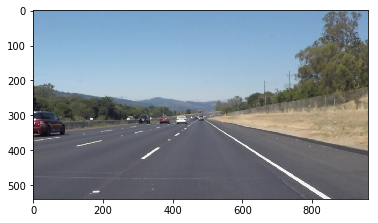

In [2]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

## Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images
`cv2.cvtColor()` to grayscale or change color
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

## Helper Functions

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [17]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Creates an image mask of size of the input image and sets all pixels to 0 
    except for pixels within the polygon defined by the vertices which are set
    to 255 for each image channel.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_countregion_of_interest
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    return mask


def draw_lines(image, lines=[],debug=False, color=[255, 0, 0], thickness=10):
    """
    Current limitation - does not filter detected line over multiple images 
    and it does not retain the last best guess when no line is detected
    """
    i=0
    slope = []
    line_left = []
    slope_left = []
    intercept_left = []
    line_right =[]
    slope_right = []
    intercept_right = []
    
    length_lines_right =[]
    length_lines_left = []

    img = image.copy()
    tmp = image.copy()
    tmp2 = image.copy()
    
    imshape = img.shape
    
    if lines is not None:
        for line in lines:
            for x1,y1,x2,y2 in line: #changed order of x1,y1,x2,y2 to y1,x1,y2,x2 to match x,y to image coordinates
                cv2.line(tmp2, (x1, y1), (x2, y2), [0,0,255], 2)
                length_line = ((y2-y1)**2 +(x2-x1)**2)**0.5
            
                # handle slope = inf for perpendicular segments
                if(abs(x2-x1) == 0):
                    if (x2 < imshape[1]/2):
                        # for straight line segments, classify left and right based on x coordinates compared to center line of x axis
                        slope = -28. # slope for line at 88 deg angle with x axis
                        intercept = y1 - slope * x1
                        line_left.append(line)
                        slope_left.append(slope * length_line) # used for calculating weighted average based on length of line detected
                        intercept_left.append(intercept * length_line)
                        length_lines_left.append(length_line)
                        if debug:
                            cv2.line(tmp, (x1, y1), (x2, y2), [255,255,0], 2)
                    else:
                        # for straight line segments, classify left and right based on x coordinates compared to center line of x axis
                        slope = 28. # slope for line at 88 deg angle with x axis
                        intercept = y1 - slope * x1
                        line_right.append(line)
                        slope_right.append(slope * length_line) # slope for line at 89.99 deg angle with x axis
                        intercept_right.append(intercept * length_line)
                        length_lines_right.append(length_line)
                        if debug:
                            cv2.line(tmp, (x1, y1), (x2, y2), [0,255,255], 2)
                # for all other lines classify left or right based on sign of the slope value
                # +ve slope implies left lane, -ve implies right lane in cartesian co-ordinates
                else:
                    slope = (y2-y1)/(x2-x1)
                    intercept = y1 - slope * x1
                    if ((slope < 0)& (intercept > 1.1 * imshape[0])\
                        &(x1 < 0.5 * imshape[1]) & (x2 < 0.5 * imshape[1])): # < 0 because Y axis direction of image axis is inverted from cartesian Y
                        line_left.append(line)
                        slope_left.append(slope * length_line)
                        intercept_left.append(intercept * length_line)
                        length_lines_left.append(length_line)
                        if debug:
                            cv2.line(tmp, (x1, y1), (x2, y2), [255,255,0], 2)
                    if ((slope > 0) & (intercept < 0.1 * imshape[0])\
                        &(x1 > 0.5 * imshape[1]) & (x2 > 0.5 * imshape[1])): # > 0 because Y axis direction of image axis is inverted from cartesian Y
                        line_right.append(line)
                        slope_right.append(slope * length_line)
                        intercept_right.append(intercept * length_line)
                        length_lines_right.append(length_line)
                        if debug:
                            cv2.line(tmp, (x1, y1), (x2, y2), [0,255,255], 2)
        
                    
        # calculate average slope and intercept of all the detected lines
        # calculate x1 and x2 of the line with average slope and intercept for points y1 = max(Y-axis) and y2 = 0.5*max(Y-axis) 
        # y = m*x + c implies x = (y - c)/m
        y1 = imshape[0]
        y2 = int(0.65 * imshape[0])
        # calculate for right lane
        if (len(line_right) > 0):
            average_intercept_right = sum(intercept_right)/sum(length_lines_right)
            average_slope_right = sum(slope_right)/sum(length_lines_right)
            x1_r = int((y1 - average_intercept_right)/average_slope_right)
            x2_r = int((y2 - average_intercept_right)/average_slope_right)
            # verfify calculated points lie on the image frame and plot the lines
            if ((x1_r <= imshape[1]) & (x2_r <= imshape[1])) :
                cv2.line(img, (x1_r, y1), (x2_r, y2), [255,0,0], 10)
                if debug:
                    cv2.line(tmp, (x1_r, y1), (x2_r, y2), [0,255,255], 1)
            #print(average_slope_right)
            #print(average_intercept_right)
        # calculate for left lane
        if (len(line_left) > 0):
            average_slope_left = sum(slope_left)/sum(length_lines_left)
            average_intercept_left = sum(intercept_left)/sum(length_lines_left)
            x1_l = int((y1 - average_intercept_left)/average_slope_left)
            x2_l = int((y2 - average_intercept_left)/average_slope_left)
            # verfify calculated points lie on the image frame and plot the lines
            if ((x1_l <= imshape[1]) & (x2_l <= imshape[1])):
                cv2.line(img, (x1_l, y1), (x2_l, y2), [255,0,0], 10)
                if debug:
                    cv2.line(tmp, (x1_l, y1), (x2_l, y2), [255,255,0], 1)
    if debug:
        ret = [img, tmp, tmp2] #
        return ret
    else:
        return img
        #print(average_intercept_left)
        
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, debug = False):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    #if (lines.any):  
    if debug:
        output = draw_lines(line_img, lines, True)
        return output
    else:
        output = draw_lines(line_img, lines)
        return output


def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

# make plots for documentation and debugging 
def makeplots(result, outputname):
    
    f,((ax1, ax2, ax3),( ax4, ax5, ax6),( ax7, ax8, ax9)) = plt.subplots(3,3, sharey = True)
    ax1.imshow(result[9])
    ax1.set_title("0: Original")
    ax1.axis('off')
    
    ax2.imshow(result[1], cmap='Greys_r')
    ax2.set_title("2: Blurred gray")
    ax2.axis('off')
    #plt.show()
    #ax2.imshow(final_image)
    ax4.imshow(result[8], cmap='Greys_r')
    ax4.set_title("4: Masks")
    ax4.axis('off')
    
    ax3.imshow(result[2], cmap='Greys_r')
    ax3.set_title("3: Edge detection")
    ax3.axis('off')
    
    ax5.imshow(result[3], cmap='Greys_r')
    ax5.set_title("5: Region masked")
    ax5.axis('off')
    
    ax6.imshow(result[7], cmap='Greys_r')
    ax6.set_title("6: All Lines")
    ax6.axis('off')
    
    ax7.imshow(result[6], cmap='Greys_r')
    ax7.set_title("7: Selected Lines")
    ax7.axis('off')
    
    ax8.imshow(result[4], cmap='Greys_r')
    ax8.set_title("8: Averaged Lanes")
    ax8.axis('off')
    
    ax9.imshow(result[5], cmap='Greys_r')
    ax9.set_title("9: Final output")
    ax9.axis('off')
    f.subplots_adjust(hspace=0.3)
    plt.savefig(outputname, bbox_inches='tight', dpi=1000)
    plt.show()

# process_image_challenge() defined for processing challenge video to account for vehicle bonnet recorded in the image
idx_name = 0
def process_image_challenge(image,outputname = "Output", debug = False):
    global idx_name
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    lower_thd = np.array([90,90,0])
    upper_thd = np.array([255,255,255])
    #create a color selection based mask for the image
    maskColor = cv2.inRange(image,lower_thd,upper_thd)
    #Canny edge detection
    grayImage = grayscale(image)
    
    #Attempt to use localized histogram equaliztion to help detect features in dynamic ligh and shadow conditions
    #However, need to enhance edge rejection methods to successfully  use this.
    
    #clahe = cv2.createCLAHE(tileGridSize =(50,50))
    #histImage = clahe.apply(grayImage)
    #plt.imshow(histImage, cmap = 'Greys_r')
    kernel_size = 7
    blurGrayImage = gaussian_blur(grayImage,kernel_size)
    lowCannyThd = 25
    highCannyThd = 50
    edges = canny(blurGrayImage,lowCannyThd,highCannyThd)
    edges = cv2.bitwise_and(edges,maskColor)
    
    # select region of interest - polygon 
    imshape = blurGrayImage.shape
    
    polyLowerLeft = ([0.15 * imshape[1] ,0.92 * imshape[0]])
    polyUpperLeft = ([0.45 * imshape[1], 0.6 * imshape[0]])
    polyUpperRight = ([0.54 * imshape[1],0.6 * imshape[0]])
    polyLowerRight = ([0.9 * imshape[1],0.92 * imshape[0]])
    poly = np.array([[polyLowerLeft, polyUpperLeft, polyUpperRight, polyLowerRight]], dtype = np.int32)
    
    maskRegion = region_of_interest(edges, poly)
    
    masked_edges = cv2.bitwise_and(edges, maskRegion)
    
    # Hough transform
    # set up Hough parameters
    rho = 1
    theta = np.pi/180
    threshold = 20
    min_line_len = 15
    max_line_gap = 2
    if debug:
        # create blank image for displaying masks
        mask_image = weighted_img(edges,maskRegion//2)
        mask_image = weighted_img(mask_image, maskColor//3)
    # using helper function for plotting all the detected lines
    if(debug):
        output= hough_lines(masked_edges, rho, theta, threshold, min_line_len, max_line_gap,True)
        line_image = output[0]
    else:
        line_image = hough_lines(masked_edges, rho, theta, threshold, min_line_len, max_line_gap,False)
    # create blank image for mixed image with lines
    result = np.copy(image)*0
    # using helper function for superimposing lines on actual image
    result = weighted_img(image,line_image)
    if debug:
        if (outputname == "Output"):
            outputname = "./test_image_output/from_videos/output" + str(idx_name)
            idx_name += 1
        makeplots([grayImage, blurGrayImage, edges, masked_edges,line_image, result,output[1],output[2],mask_image, image],outputname)
    return result

## Test Images

Build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

In [7]:
import os
imageList = os.listdir("test_images/")

## Build a Lane Finding Pipeline



# Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

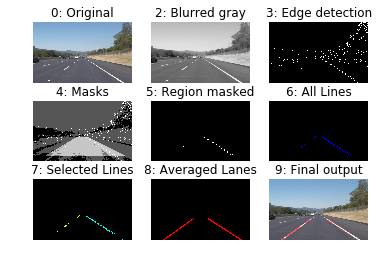

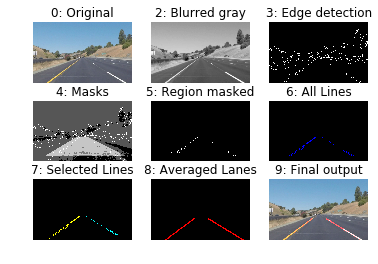

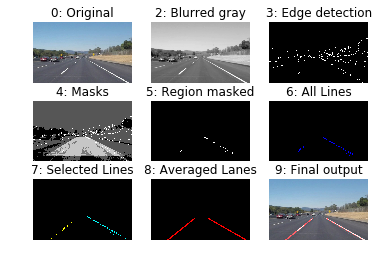

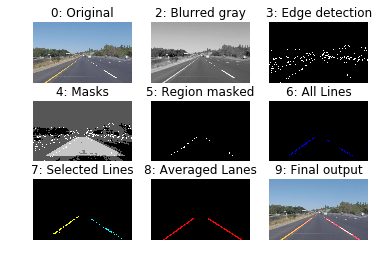

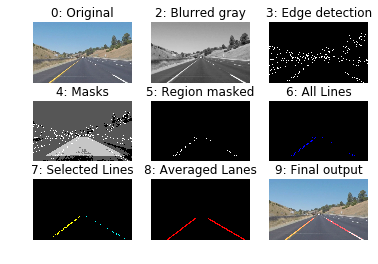

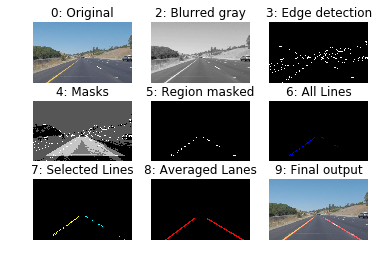

In [11]:
# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images directory.
for i in range(np.size(imageList)):
#for i in  range(1):
    filename = "./test_images/" + imageList[i]
    outputname = "./test_image_output/output"+str(i)+".png"
    image = mpimg.imread(filename)
    result = process_image_challenge(image, outputname, True)


##### Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [9]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [10]:
# process_image() defined for processing test videos except challenge video
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    lower_thd = np.array([100,100,0])
    upper_thd = np.array([255,255,255])
    #create a color selection based mask for the image
    maskColor = cv2.inRange(image,lower_thd,upper_thd)
    #Canny edge detection
    grayImage = grayscale(image)
    clahe = cv2.createCLAHE(tileGridSize =(50,50))
    histImage = clahe.apply(grayImage)
    #plt.imshow(histImage, cmap = 'Greys_r')
    kernel_size = 11
    blurGrayImage = gaussian_blur(grayImage,kernel_size)
    lowCannyThd = 40
    highCannyThd = 90
    edges = canny(blurGrayImage,lowCannyThd,highCannyThd)
    # select region of interest - polygon 
    maskArea = np.zeros_like(grayImage)
    ignore_mask_color = 255
    imshape = blurGrayImage.shape
    
    polyLowerLeft = ([0,imshape[0]])
    polyUpperLeft = ([-5 + imshape[1]/2, 50 + imshape[0]/2])
    polyUpperRight = ([+5 + imshape[1]/2,50 + imshape[0]/2])
    polyLowerRight = ([imshape[1],imshape[0]])
    poly = np.array([[polyLowerLeft, polyUpperLeft, polyUpperRight, polyLowerRight]], dtype = np.int32)
    
    #edges = cv2.bitwise_and(edges,maskColor)
    maskedEdges = region_of_interest(edges, poly)
    maskColor *= maskArea
    # Hough transform
    # set up Hough parameters
    rho = 1
    theta = np.pi/180
    threshold = 20
    min_line_len = 40
    max_line_gap = 10
    
    # create blank image for lines
    line_image = np.copy(image)*0
    # using helper function for plotting all the detected lines
    line_image = hough_lines(maskedEdges, rho, theta, threshold, min_line_len, max_line_gap)
    # create blank image for mixed image with lines
    result = np.copy(image)*0
    # using helper function for superimposing lines on actual image
    result = weighted_img(line_image,image)
    return result




Let's try the one with the solid white lane on the right first ...

In [19]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("./test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image_challenge)  #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidWhiteRight.mp4
[MoviePy] Writing video test_videos_output/solidWhiteRight.mp4



100%|█████████▉| 221/222 [00:09<00:00, 22.56it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidWhiteRight.mp4 

CPU times: user 12.9 s, sys: 304 ms, total: 13.2 s
Wall time: 10.4 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [21]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Improve the draw_lines() function

**At this point, if you were successful with making the pipeline and tuning parameters, you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform. As mentioned previously, try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines. You can see an example of the result you're going for in the video "P1_example.mp4".**

**Go back and modify your draw_lines function accordingly and try re-running your pipeline. The new output should draw a single, solid line over the left lane line and a single, solid line over the right lane line. The lines should start from the bottom of the image and extend out to the top of the region of interest.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

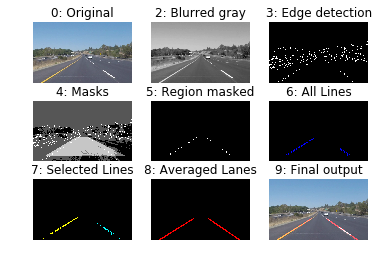

[MoviePy] >>>> Building video test_videos_output/solidYellowLeft.mp4
[MoviePy] Writing video test_videos_output/solidYellowLeft.mp4


  0%|          | 0/682 [00:00<?, ?it/s]

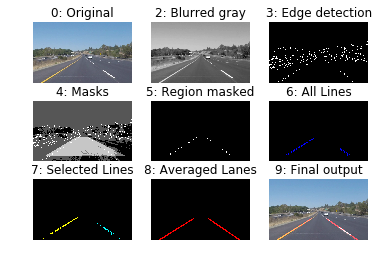

  0%|          | 1/682 [00:10<2:00:18, 10.60s/it]

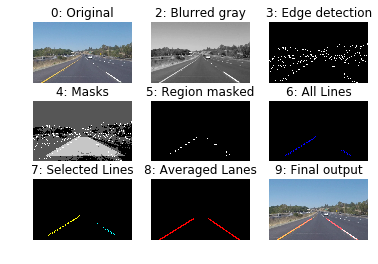

  0%|          | 2/682 [00:21<2:00:40, 10.65s/it]

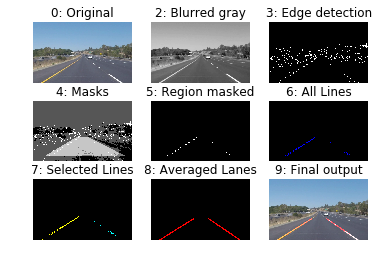

  0%|          | 3/682 [00:31<2:00:05, 10.61s/it]

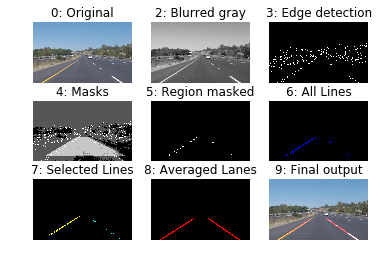

  1%|          | 4/682 [00:42<1:59:24, 10.57s/it]

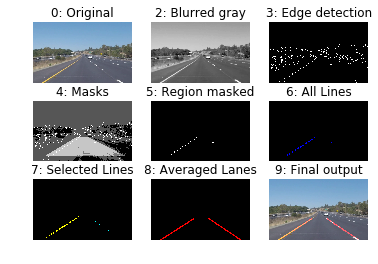

  1%|          | 5/682 [00:52<1:58:47, 10.53s/it]

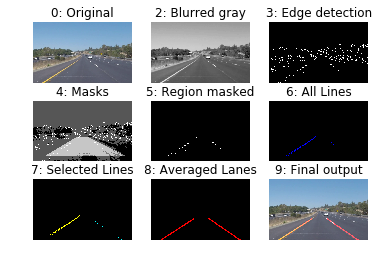

  1%|          | 6/682 [01:03<1:57:54, 10.47s/it]

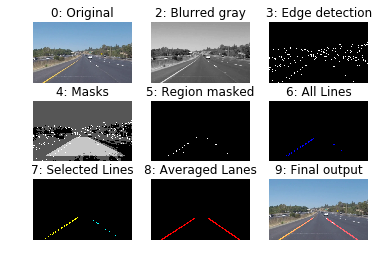

  1%|          | 7/682 [01:13<1:57:25, 10.44s/it]

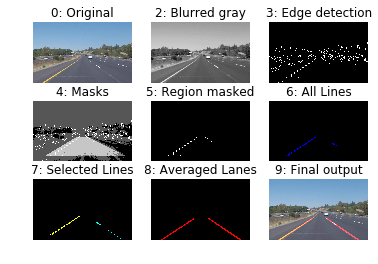

  1%|          | 8/682 [01:23<1:57:02, 10.42s/it]

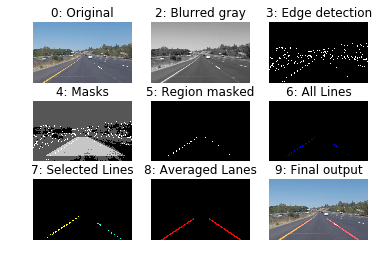

  1%|▏         | 9/682 [01:34<1:56:36, 10.40s/it]

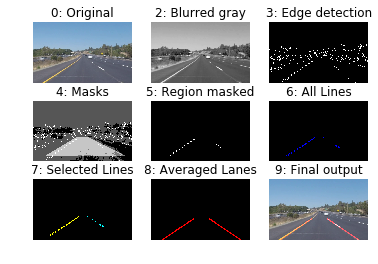

  1%|▏         | 10/682 [01:44<1:56:26, 10.40s/it]

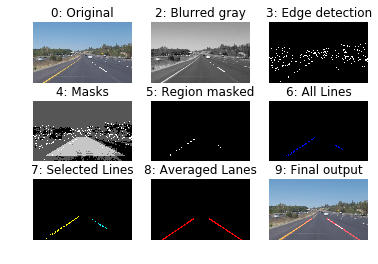

  2%|▏         | 11/682 [01:55<1:56:49, 10.45s/it]

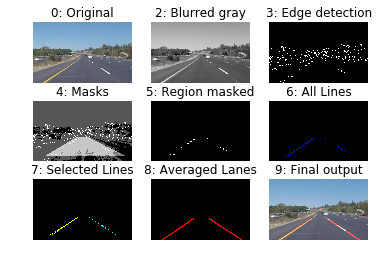

  2%|▏         | 12/682 [02:05<1:56:35, 10.44s/it]

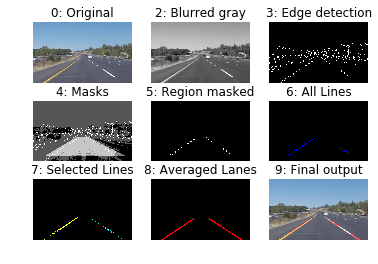

  2%|▏         | 13/682 [02:16<1:56:29, 10.45s/it]

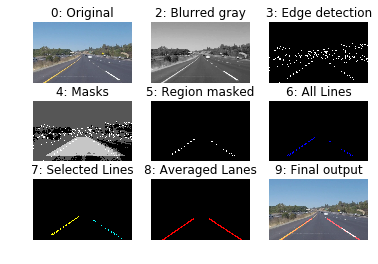

  2%|▏         | 14/682 [02:26<1:56:25, 10.46s/it]

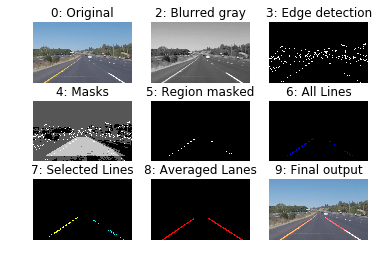

  2%|▏         | 15/682 [02:36<1:56:02, 10.44s/it]

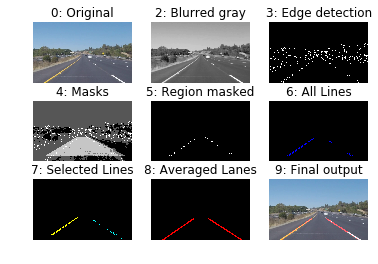

  2%|▏         | 16/682 [02:47<1:56:07, 10.46s/it]

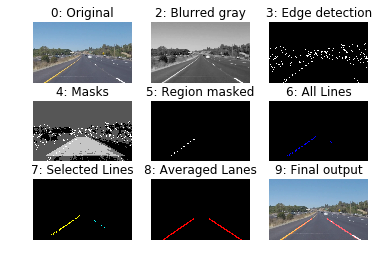

  2%|▏         | 17/682 [02:57<1:55:33, 10.43s/it]

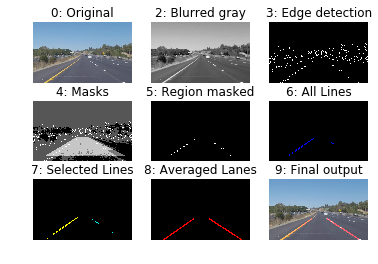

  3%|▎         | 18/682 [03:08<1:55:44, 10.46s/it]

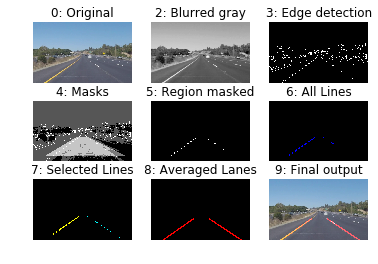

  3%|▎         | 19/682 [03:18<1:55:08, 10.42s/it]

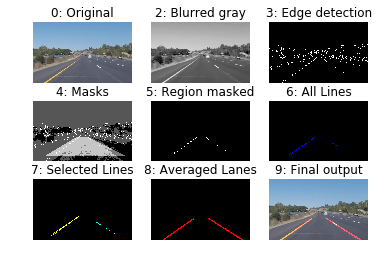

  3%|▎         | 20/682 [03:29<1:54:58, 10.42s/it]

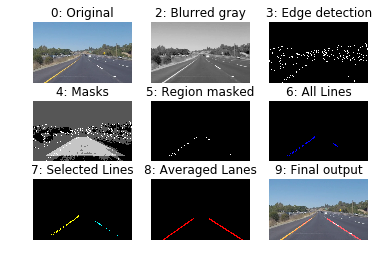

  3%|▎         | 21/682 [03:39<1:54:47, 10.42s/it]

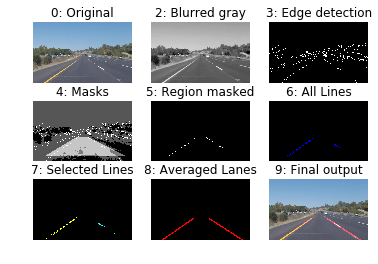

  3%|▎         | 22/682 [03:49<1:54:53, 10.44s/it]

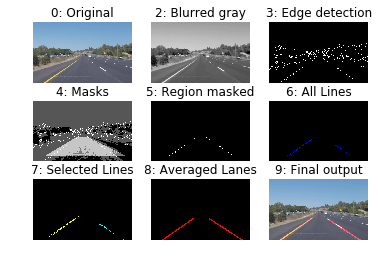

  3%|▎         | 23/682 [04:00<1:54:40, 10.44s/it]

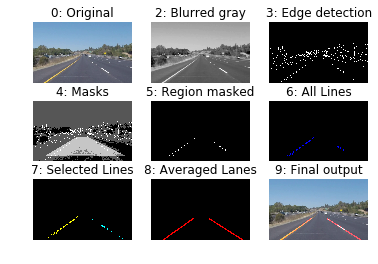

  4%|▎         | 24/682 [04:10<1:54:24, 10.43s/it]

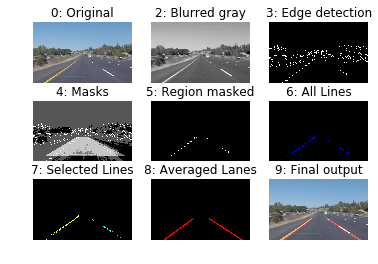

  4%|▎         | 25/682 [04:21<1:54:48, 10.49s/it]

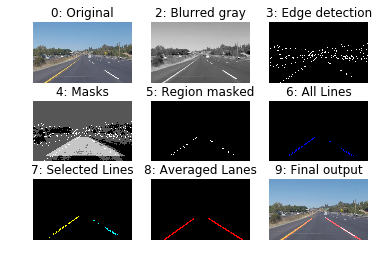

  4%|▍         | 26/682 [04:31<1:54:38, 10.49s/it]

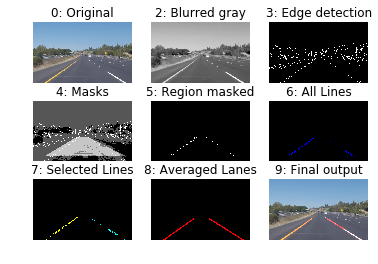

  4%|▍         | 27/682 [04:42<1:54:41, 10.51s/it]

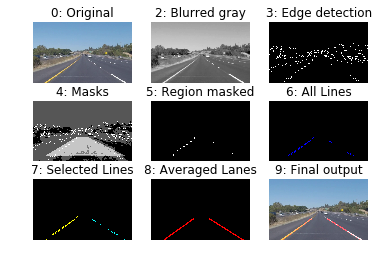

  4%|▍         | 28/682 [04:52<1:54:16, 10.48s/it]

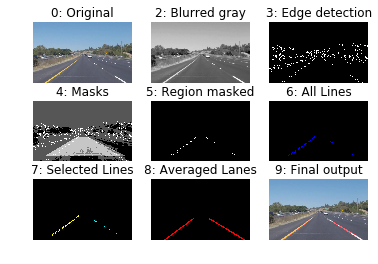

  4%|▍         | 29/682 [05:03<1:54:11, 10.49s/it]

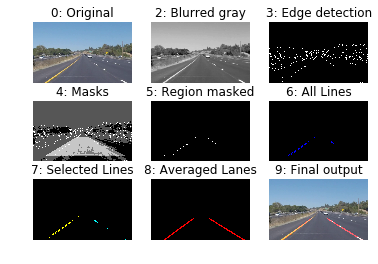

  4%|▍         | 30/682 [05:13<1:53:22, 10.43s/it]

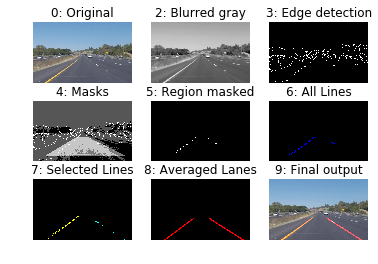

  5%|▍         | 31/682 [05:24<1:53:34, 10.47s/it]

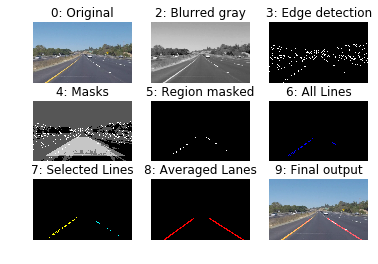

  5%|▍         | 32/682 [05:34<1:53:27, 10.47s/it]

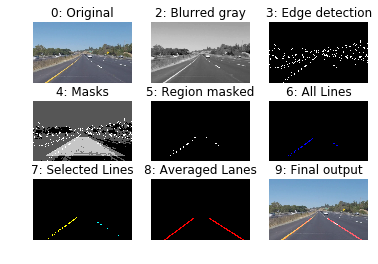

  5%|▍         | 33/682 [05:45<1:53:28, 10.49s/it]

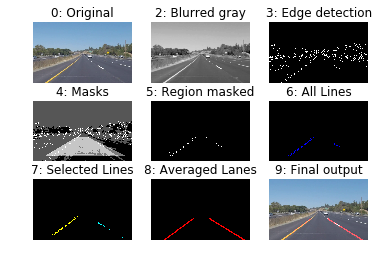

  5%|▍         | 34/682 [05:55<1:53:36, 10.52s/it]

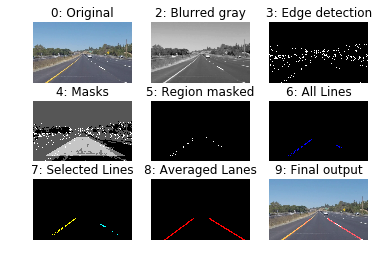

  5%|▌         | 35/682 [06:06<1:53:00, 10.48s/it]

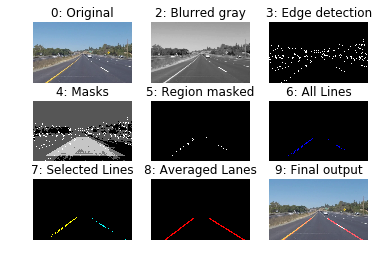

  5%|▌         | 36/682 [06:16<1:52:52, 10.48s/it]

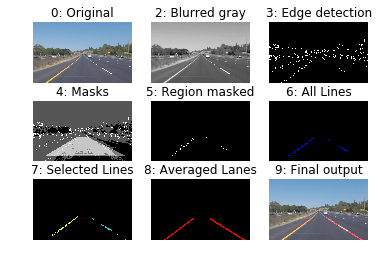

  5%|▌         | 37/682 [06:27<1:53:50, 10.59s/it]

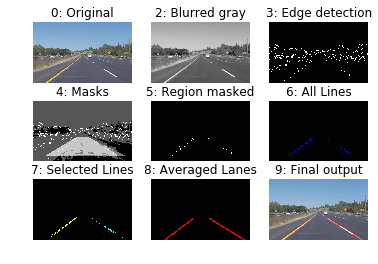

  6%|▌         | 38/682 [06:38<1:53:07, 10.54s/it]

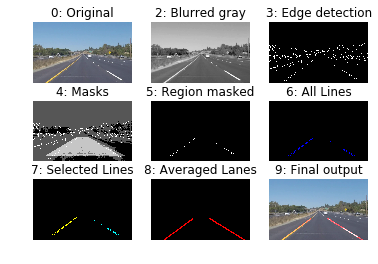

  6%|▌         | 39/682 [06:48<1:52:22, 10.49s/it]

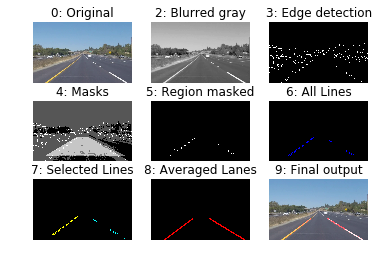

  6%|▌         | 40/682 [06:58<1:52:05, 10.48s/it]

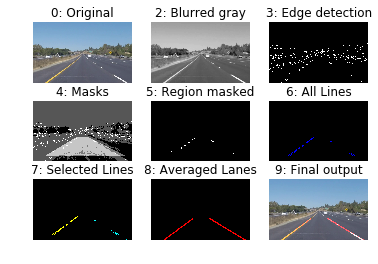

  6%|▌         | 41/682 [07:09<1:51:43, 10.46s/it]

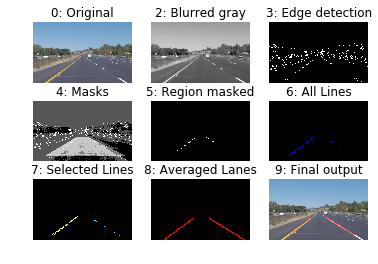

  6%|▌         | 42/682 [07:19<1:51:28, 10.45s/it]

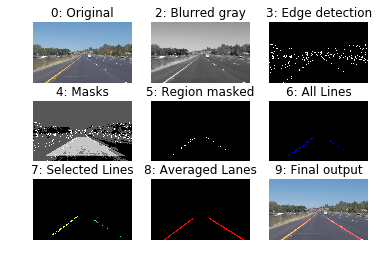

  6%|▋         | 43/682 [07:30<1:51:14, 10.44s/it]

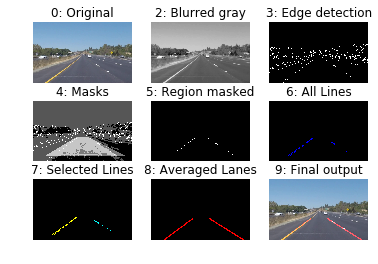

  6%|▋         | 44/682 [07:40<1:51:04, 10.45s/it]

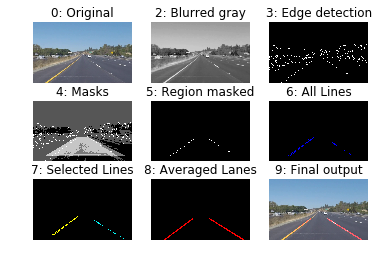

  7%|▋         | 45/682 [07:51<1:51:06, 10.47s/it]

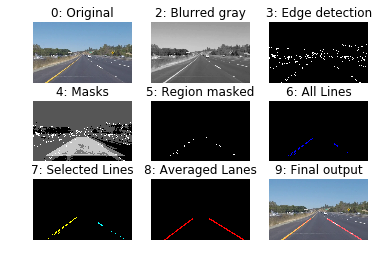

  7%|▋         | 46/682 [08:01<1:50:51, 10.46s/it]

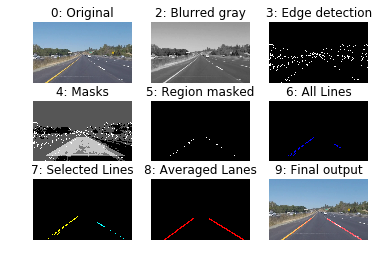

  7%|▋         | 47/682 [08:12<1:51:00, 10.49s/it]

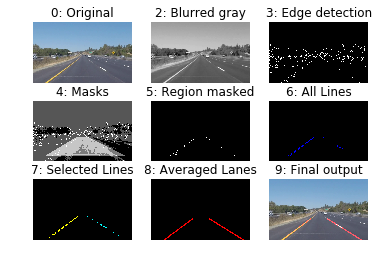

  7%|▋         | 48/682 [08:22<1:50:46, 10.48s/it]

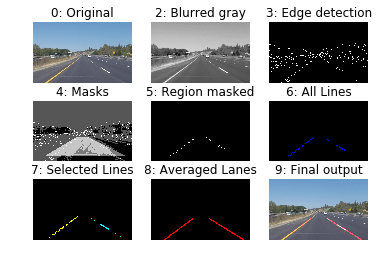

  7%|▋         | 49/682 [08:33<1:50:41, 10.49s/it]

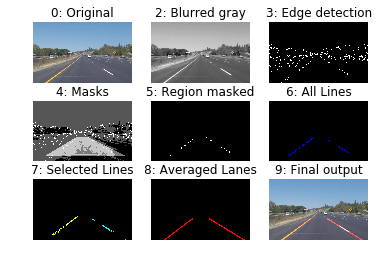

  7%|▋         | 50/682 [08:43<1:50:23, 10.48s/it]

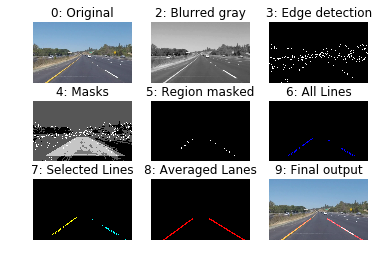

  7%|▋         | 51/682 [08:54<1:50:28, 10.50s/it]

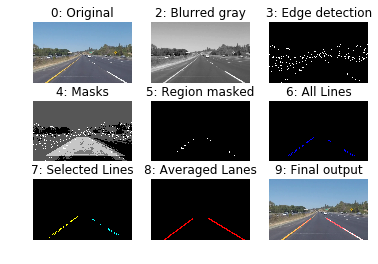

  8%|▊         | 52/682 [09:04<1:50:14, 10.50s/it]

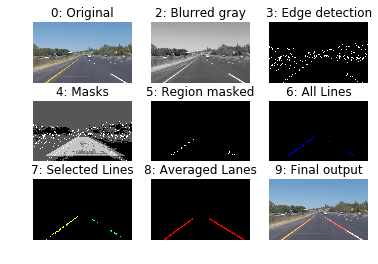

  8%|▊         | 53/682 [09:15<1:50:14, 10.52s/it]

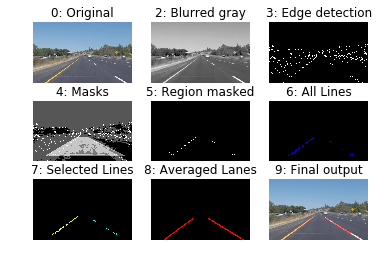

  8%|▊         | 54/682 [09:25<1:49:49, 10.49s/it]

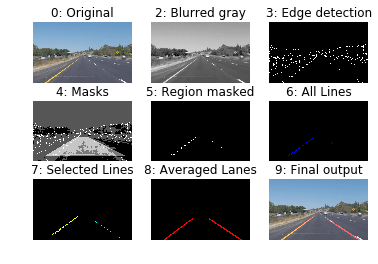

  8%|▊         | 55/682 [09:36<1:50:21, 10.56s/it]

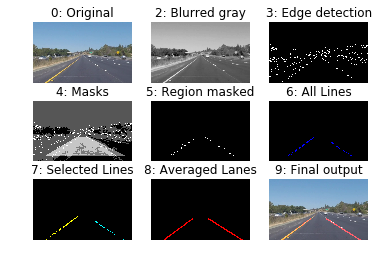

  8%|▊         | 56/682 [09:46<1:50:18, 10.57s/it]

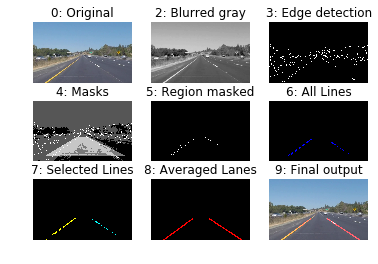

  8%|▊         | 57/682 [09:57<1:49:55, 10.55s/it]

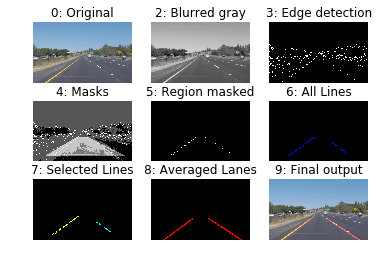

  9%|▊         | 58/682 [10:07<1:49:32, 10.53s/it]

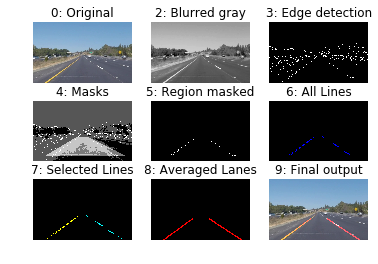

  9%|▊         | 59/682 [10:18<1:48:58, 10.50s/it]

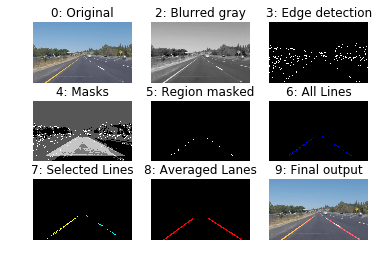

  9%|▉         | 60/682 [10:28<1:49:00, 10.52s/it]

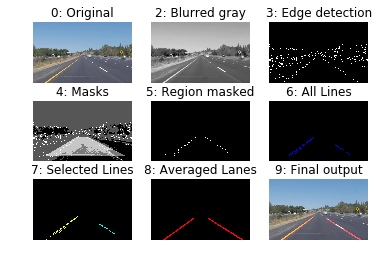

  9%|▉         | 61/682 [10:39<1:48:46, 10.51s/it]

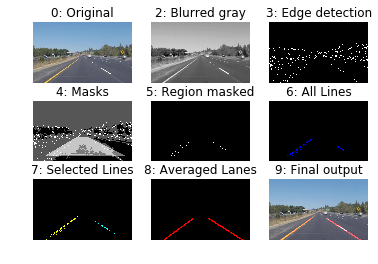

  9%|▉         | 62/682 [10:49<1:48:44, 10.52s/it]

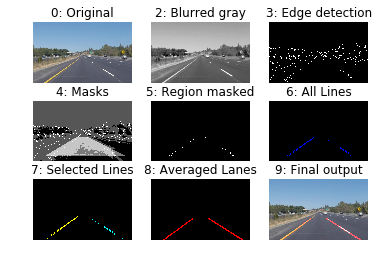

  9%|▉         | 63/682 [11:00<1:48:09, 10.48s/it]

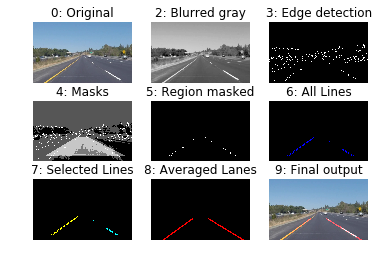

  9%|▉         | 64/682 [11:10<1:47:57, 10.48s/it]

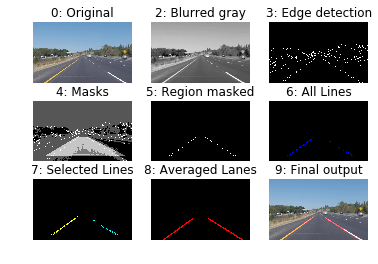

 10%|▉         | 65/682 [11:21<1:47:37, 10.47s/it]

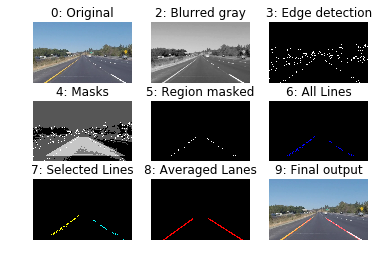

 10%|▉         | 66/682 [11:31<1:46:58, 10.42s/it]

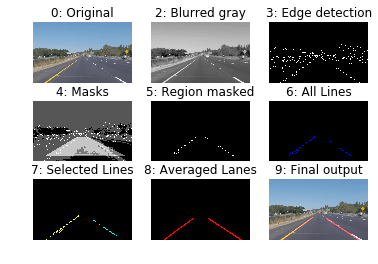

 10%|▉         | 67/682 [11:41<1:46:48, 10.42s/it]

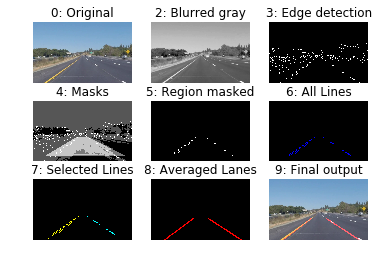

 10%|▉         | 68/682 [11:52<1:46:53, 10.45s/it]

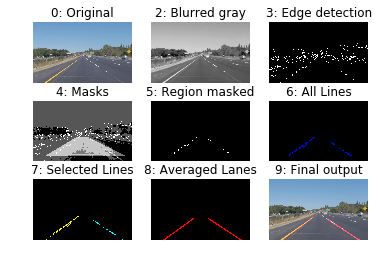

 10%|█         | 69/682 [12:02<1:47:03, 10.48s/it]

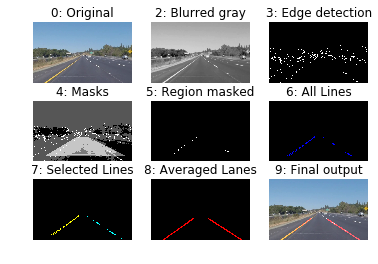

 10%|█         | 70/682 [12:13<1:46:36, 10.45s/it]

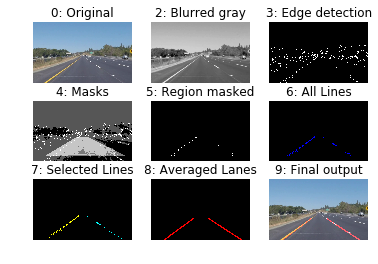

 10%|█         | 71/682 [12:23<1:46:41, 10.48s/it]

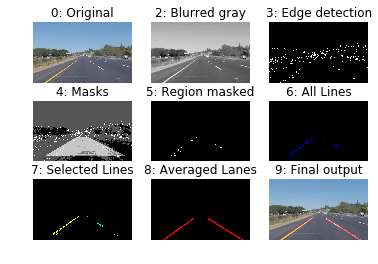

 11%|█         | 72/682 [12:34<1:46:11, 10.44s/it]

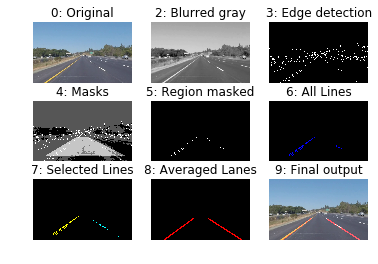

 11%|█         | 73/682 [12:44<1:46:06, 10.45s/it]

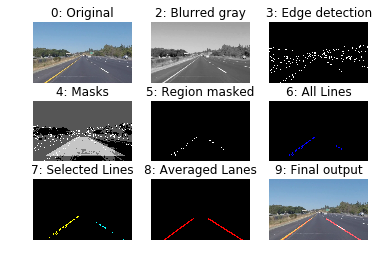

 11%|█         | 74/682 [12:55<1:45:51, 10.45s/it]

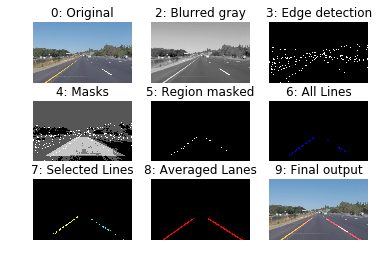

 11%|█         | 75/682 [13:05<1:45:31, 10.43s/it]

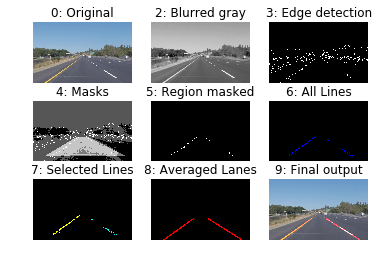

 11%|█         | 76/682 [13:15<1:45:09, 10.41s/it]

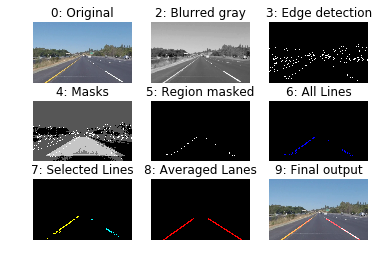

 11%|█▏        | 77/682 [13:26<1:44:54, 10.40s/it]

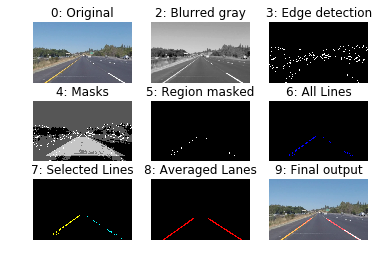

 11%|█▏        | 78/682 [13:36<1:45:03, 10.44s/it]

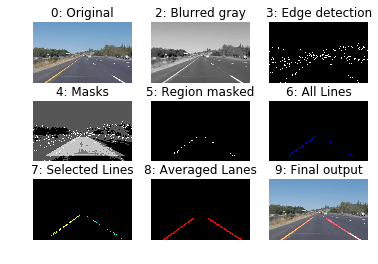

 12%|█▏        | 79/682 [13:47<1:44:42, 10.42s/it]

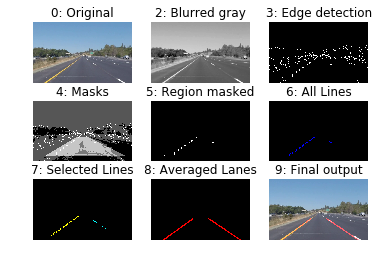

 12%|█▏        | 80/682 [13:57<1:45:00, 10.47s/it]

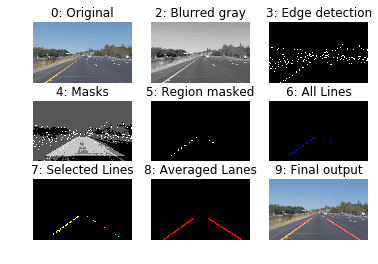

 12%|█▏        | 81/682 [14:08<1:44:38, 10.45s/it]

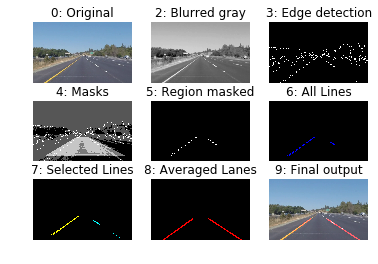

 12%|█▏        | 82/682 [14:18<1:44:28, 10.45s/it]

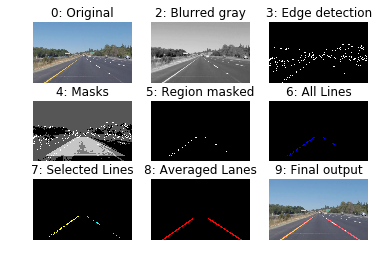

 12%|█▏        | 83/682 [14:28<1:43:59, 10.42s/it]

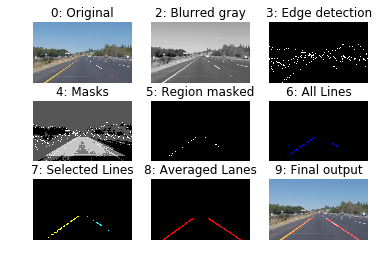

 12%|█▏        | 84/682 [14:39<1:44:06, 10.45s/it]

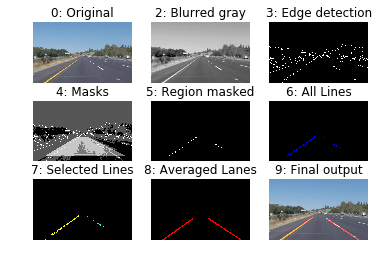

 12%|█▏        | 85/682 [14:49<1:43:35, 10.41s/it]

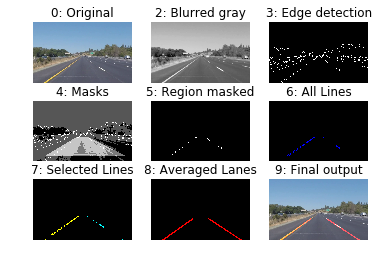

 13%|█▎        | 86/682 [15:00<1:43:45, 10.45s/it]

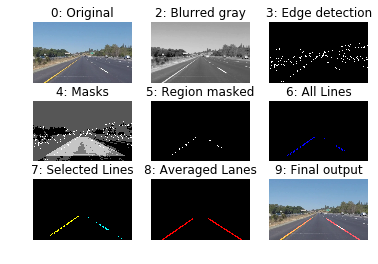

 13%|█▎        | 87/682 [15:10<1:43:12, 10.41s/it]

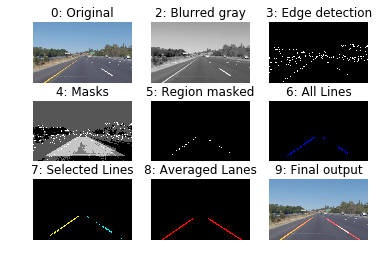

 13%|█▎        | 88/682 [15:21<1:43:05, 10.41s/it]

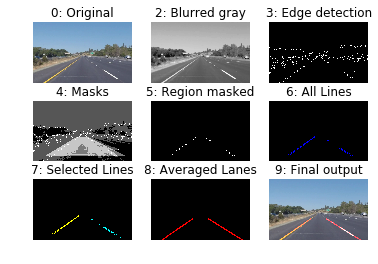

 13%|█▎        | 89/682 [15:31<1:43:06, 10.43s/it]

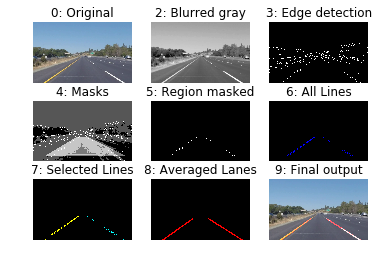

 13%|█▎        | 90/682 [15:41<1:42:53, 10.43s/it]

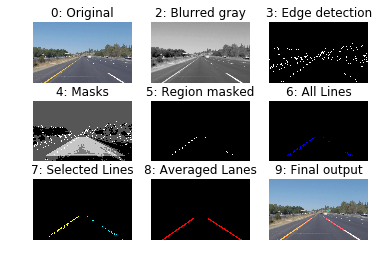

 13%|█▎        | 91/682 [15:52<1:43:37, 10.52s/it]

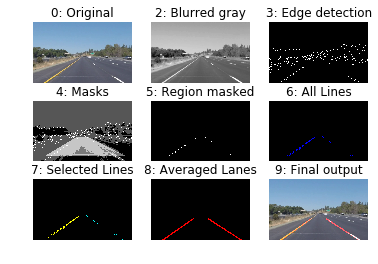

 13%|█▎        | 92/682 [16:03<1:42:57, 10.47s/it]

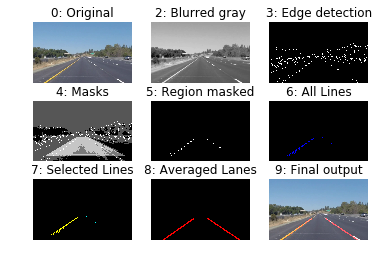

 14%|█▎        | 93/682 [16:13<1:42:48, 10.47s/it]

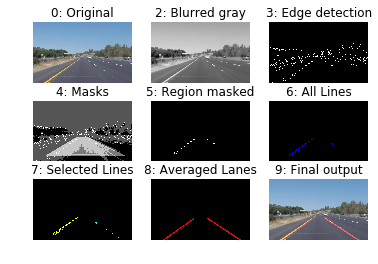

 14%|█▍        | 94/682 [16:24<1:43:29, 10.56s/it]

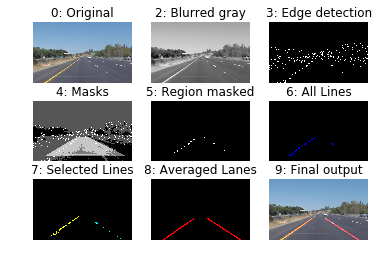

 14%|█▍        | 95/682 [16:34<1:43:14, 10.55s/it]

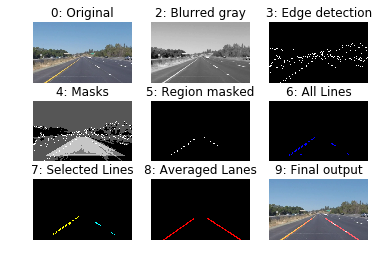

 14%|█▍        | 96/682 [16:45<1:42:27, 10.49s/it]

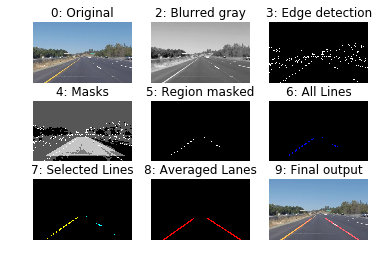

 14%|█▍        | 97/682 [16:55<1:42:27, 10.51s/it]

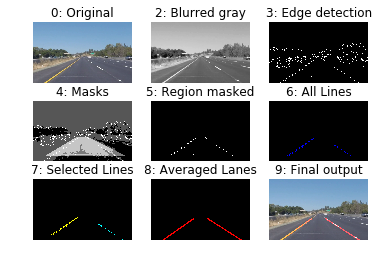

 14%|█▍        | 98/682 [17:06<1:41:48, 10.46s/it]

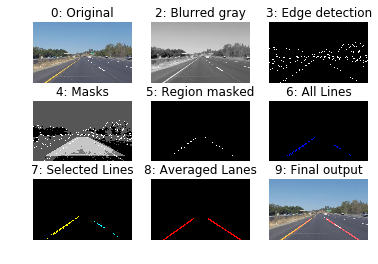

 15%|█▍        | 99/682 [17:16<1:41:26, 10.44s/it]

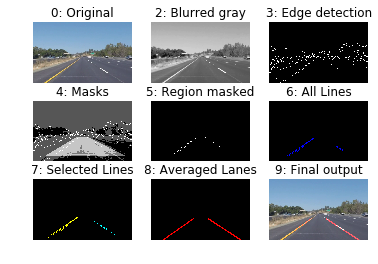

 15%|█▍        | 100/682 [17:26<1:41:15, 10.44s/it]

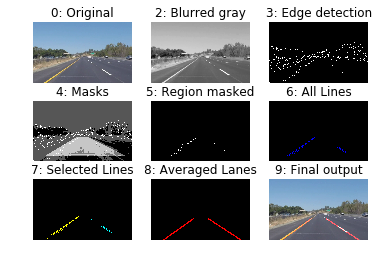

 15%|█▍        | 101/682 [17:37<1:41:00, 10.43s/it]

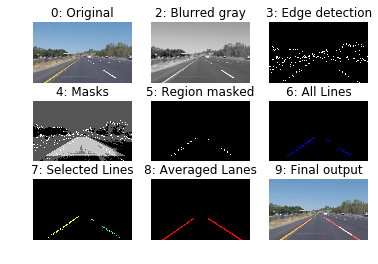

 15%|█▍        | 102/682 [17:47<1:41:06, 10.46s/it]

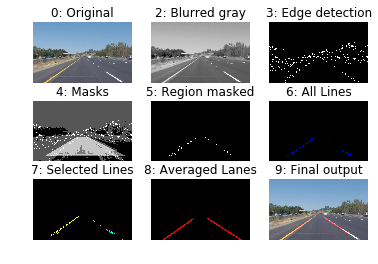

 15%|█▌        | 103/682 [17:58<1:41:07, 10.48s/it]

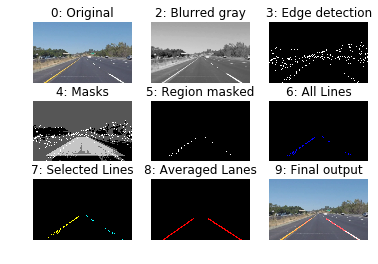

 15%|█▌        | 104/682 [18:08<1:40:50, 10.47s/it]

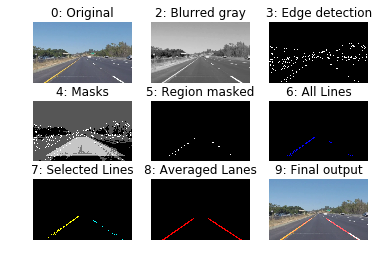

 15%|█▌        | 105/682 [18:19<1:40:08, 10.41s/it]

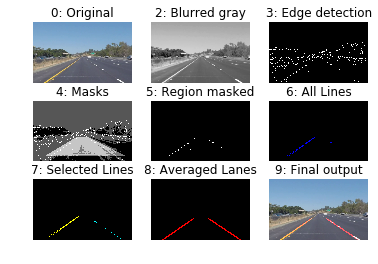

 16%|█▌        | 106/682 [18:29<1:40:12, 10.44s/it]

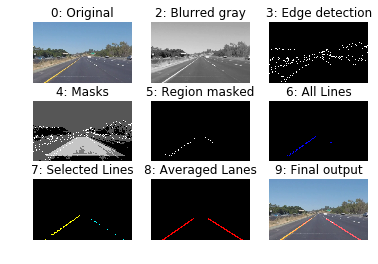

 16%|█▌        | 107/682 [18:39<1:39:34, 10.39s/it]

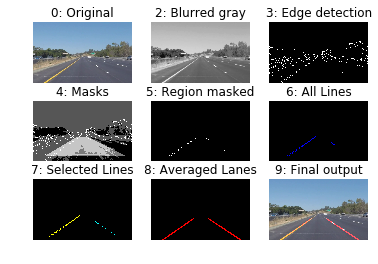

 16%|█▌        | 108/682 [18:50<1:39:40, 10.42s/it]

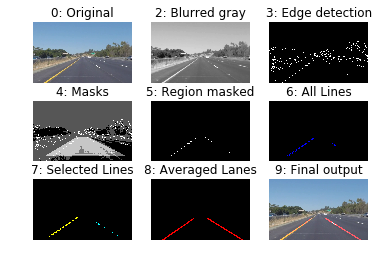

 16%|█▌        | 109/682 [19:00<1:39:16, 10.40s/it]

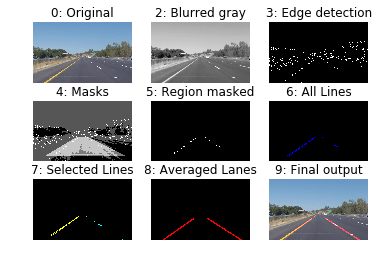

 16%|█▌        | 110/682 [19:11<1:39:23, 10.43s/it]

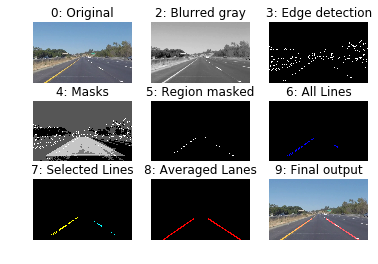

 16%|█▋        | 111/682 [19:21<1:39:08, 10.42s/it]

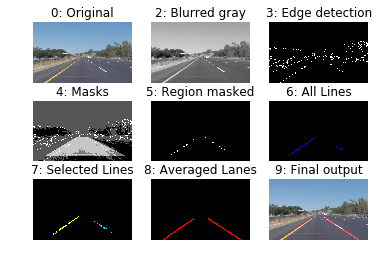

 16%|█▋        | 112/682 [19:32<1:38:55, 10.41s/it]

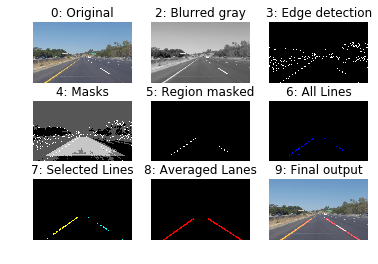

 17%|█▋        | 113/682 [19:42<1:38:55, 10.43s/it]

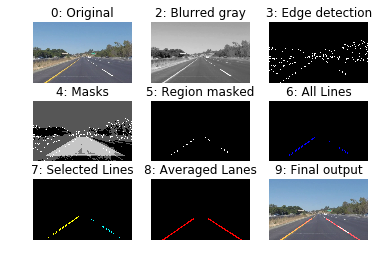

 17%|█▋        | 114/682 [19:52<1:38:56, 10.45s/it]

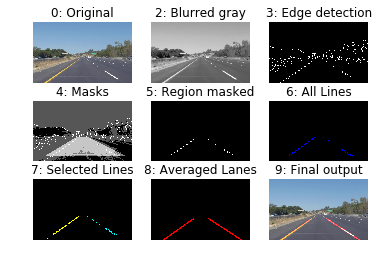

 17%|█▋        | 115/682 [20:03<1:39:04, 10.48s/it]

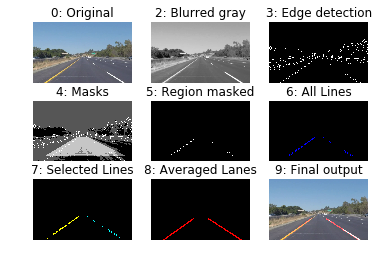

 17%|█▋        | 116/682 [20:14<1:38:50, 10.48s/it]

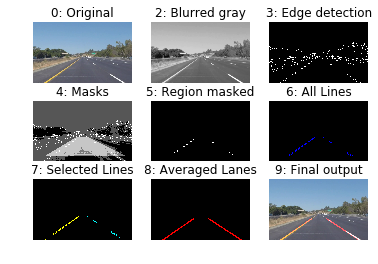

 17%|█▋        | 117/682 [20:24<1:38:32, 10.47s/it]

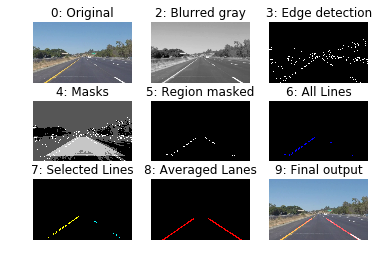

 17%|█▋        | 118/682 [20:34<1:38:34, 10.49s/it]

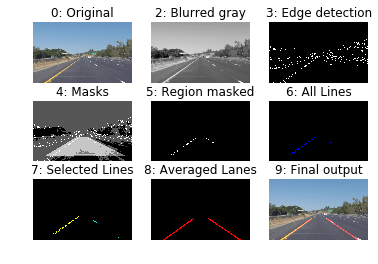

 17%|█▋        | 119/682 [20:45<1:38:40, 10.52s/it]

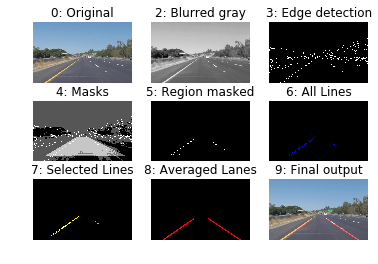

 18%|█▊        | 120/682 [20:56<1:38:14, 10.49s/it]

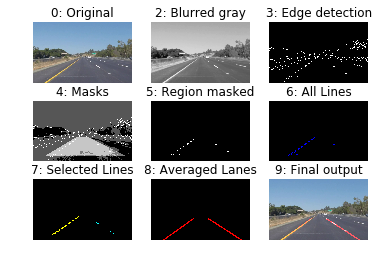

 18%|█▊        | 121/682 [21:06<1:38:11, 10.50s/it]

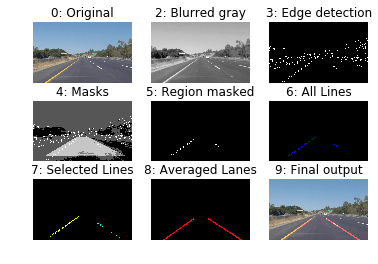

 18%|█▊        | 122/682 [21:17<1:38:02, 10.50s/it]

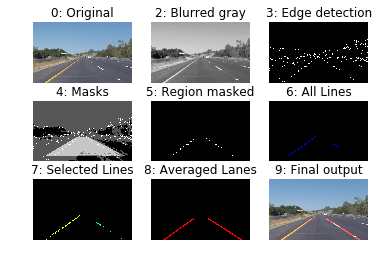

 18%|█▊        | 123/682 [21:27<1:37:31, 10.47s/it]

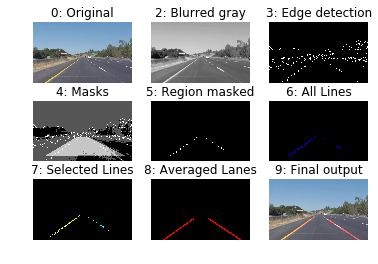

 18%|█▊        | 124/682 [21:37<1:37:20, 10.47s/it]

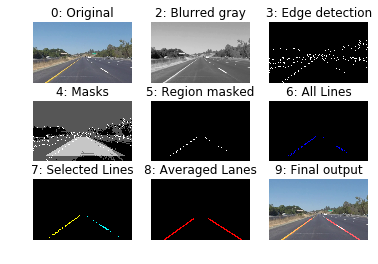

 18%|█▊        | 125/682 [21:48<1:38:55, 10.66s/it]

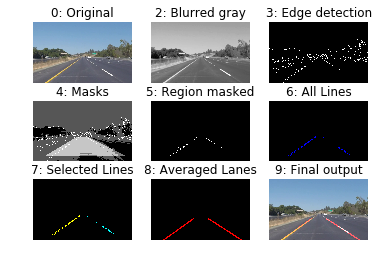

 18%|█▊        | 126/682 [21:59<1:38:56, 10.68s/it]

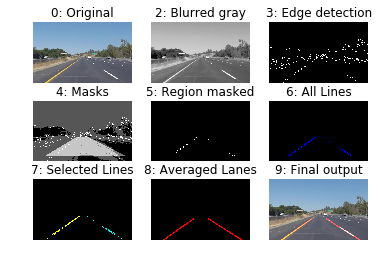

 19%|█▊        | 127/682 [22:10<1:37:54, 10.58s/it]

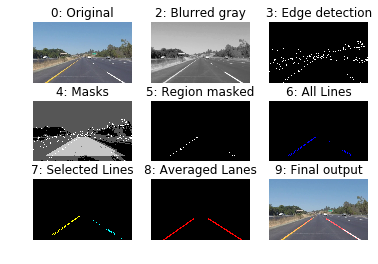

 19%|█▉        | 128/682 [22:20<1:37:12, 10.53s/it]

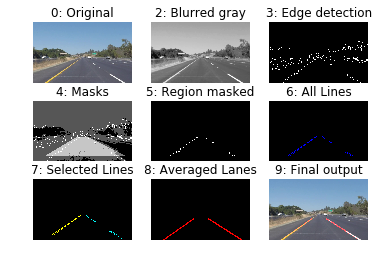

 19%|█▉        | 129/682 [22:31<1:37:10, 10.54s/it]

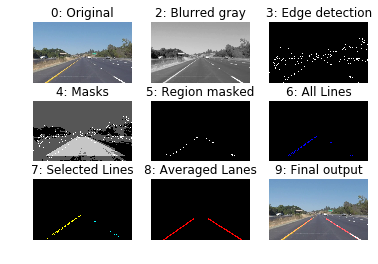

 19%|█▉        | 130/682 [22:41<1:36:55, 10.54s/it]

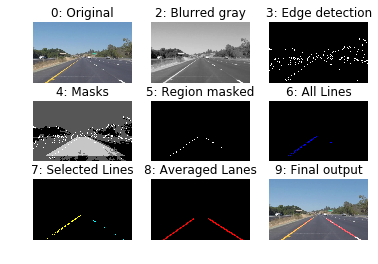

 19%|█▉        | 131/682 [22:52<1:36:29, 10.51s/it]

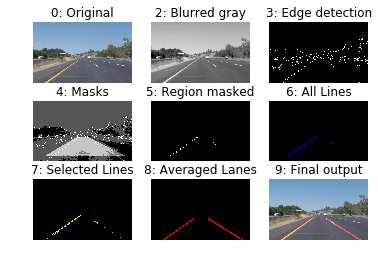

 19%|█▉        | 132/682 [23:02<1:36:14, 10.50s/it]

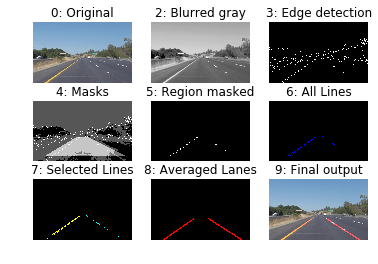

 20%|█▉        | 133/682 [23:12<1:35:57, 10.49s/it]

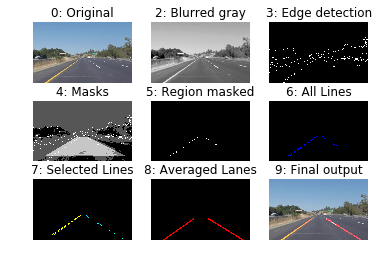

 20%|█▉        | 134/682 [23:23<1:35:18, 10.43s/it]

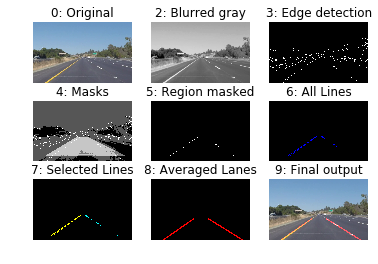

 20%|█▉        | 135/682 [23:33<1:35:03, 10.43s/it]

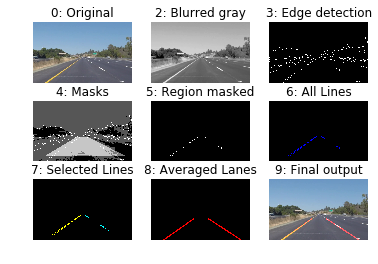

 20%|█▉        | 136/682 [23:44<1:34:43, 10.41s/it]

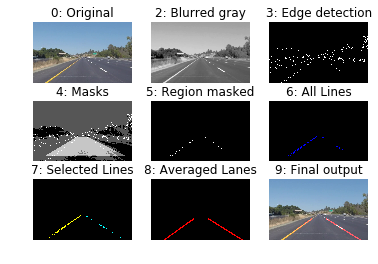

 20%|██        | 137/682 [23:54<1:35:04, 10.47s/it]

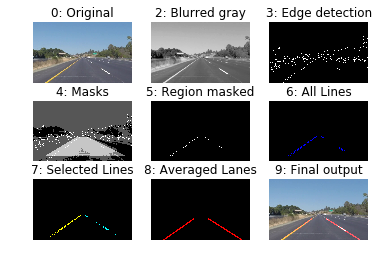

 20%|██        | 138/682 [24:04<1:34:31, 10.42s/it]

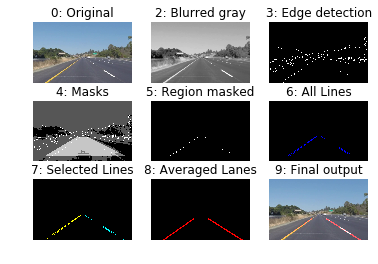

 20%|██        | 139/682 [24:15<1:34:22, 10.43s/it]

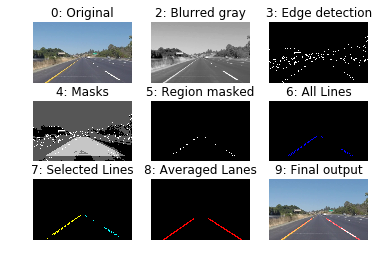

 21%|██        | 140/682 [24:25<1:34:07, 10.42s/it]

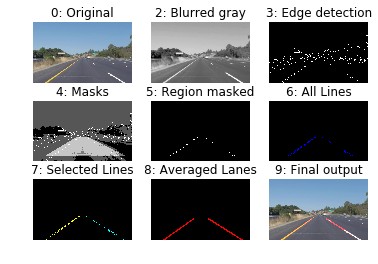

 21%|██        | 141/682 [24:36<1:34:18, 10.46s/it]

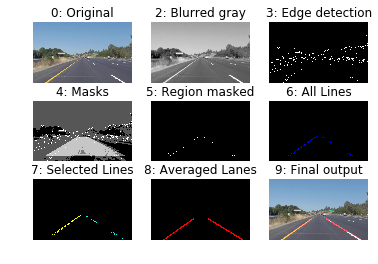

 21%|██        | 142/682 [24:46<1:34:02, 10.45s/it]

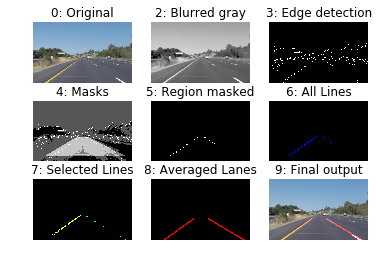

 21%|██        | 143/682 [24:57<1:33:50, 10.45s/it]

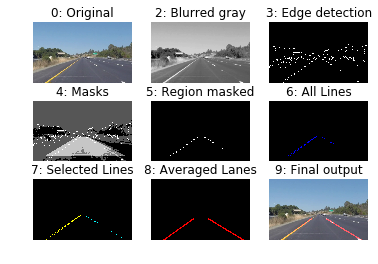

 21%|██        | 144/682 [25:07<1:33:35, 10.44s/it]

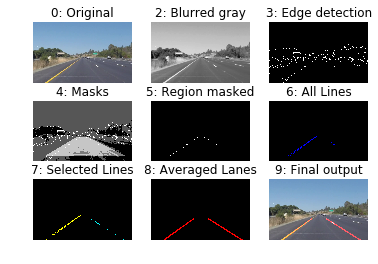

 21%|██▏       | 145/682 [25:17<1:33:00, 10.39s/it]

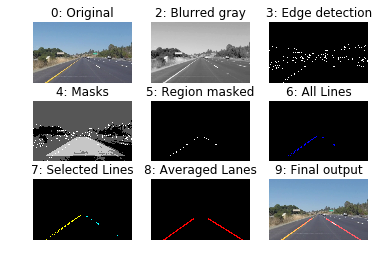

 21%|██▏       | 146/682 [25:28<1:33:05, 10.42s/it]

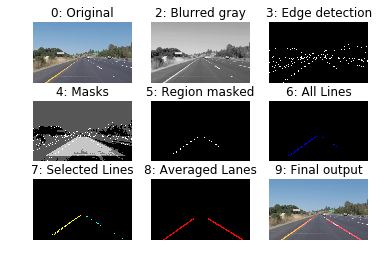

 22%|██▏       | 147/682 [25:38<1:32:58, 10.43s/it]

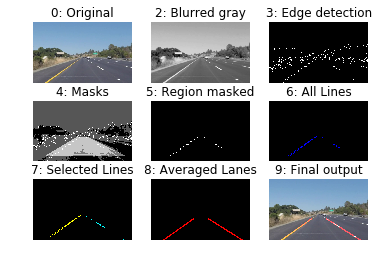

 22%|██▏       | 148/682 [25:49<1:33:24, 10.49s/it]

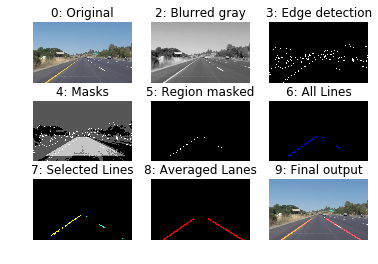

 22%|██▏       | 149/682 [25:59<1:32:47, 10.45s/it]

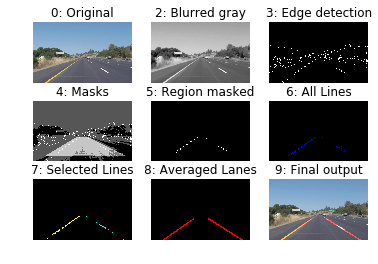

 22%|██▏       | 150/682 [26:10<1:32:39, 10.45s/it]

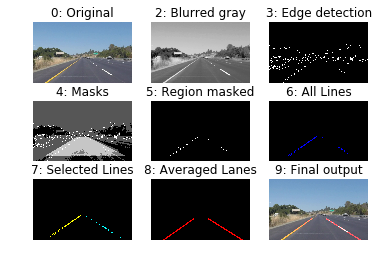

 22%|██▏       | 151/682 [26:20<1:32:30, 10.45s/it]

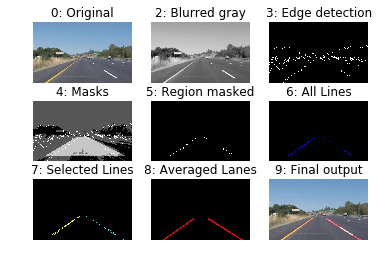

 22%|██▏       | 152/682 [26:31<1:32:32, 10.48s/it]

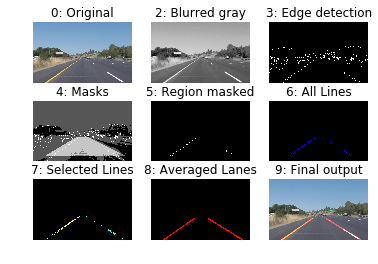

 22%|██▏       | 153/682 [26:41<1:32:03, 10.44s/it]

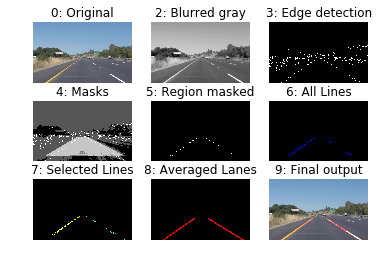

 23%|██▎       | 154/682 [26:52<1:32:10, 10.47s/it]

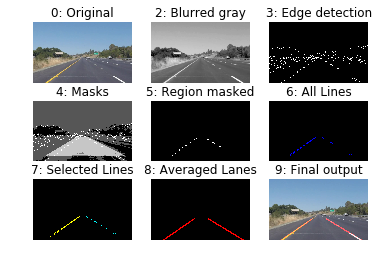

 23%|██▎       | 155/682 [27:02<1:32:05, 10.49s/it]

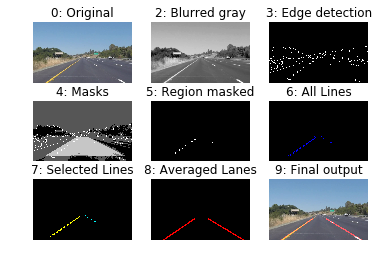

 23%|██▎       | 156/682 [27:13<1:31:51, 10.48s/it]

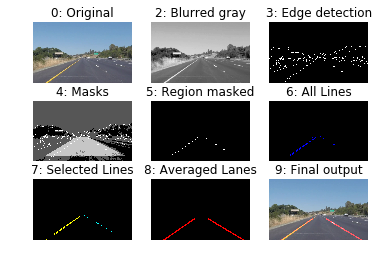

 23%|██▎       | 157/682 [27:23<1:31:27, 10.45s/it]

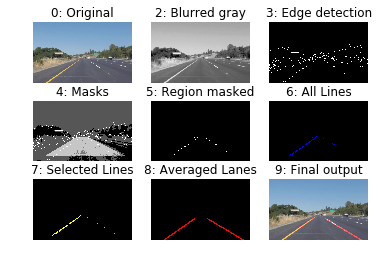

 23%|██▎       | 158/682 [27:34<1:31:27, 10.47s/it]

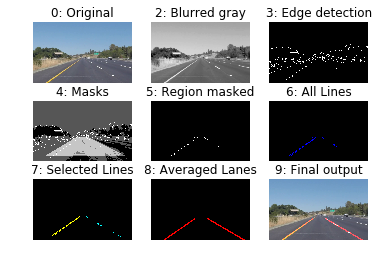

 23%|██▎       | 159/682 [27:44<1:31:17, 10.47s/it]

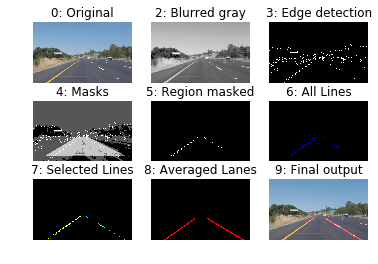

 23%|██▎       | 160/682 [27:55<1:31:17, 10.49s/it]

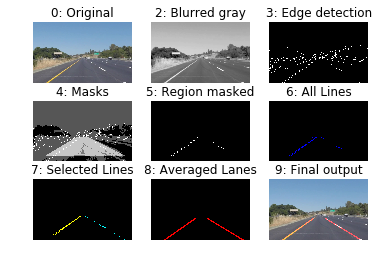

 24%|██▎       | 161/682 [28:05<1:31:07, 10.49s/it]

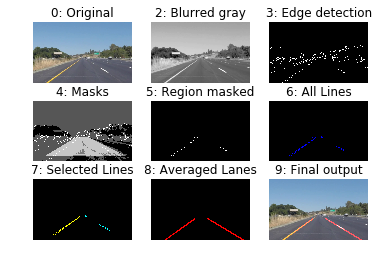

 24%|██▍       | 162/682 [28:16<1:30:46, 10.47s/it]

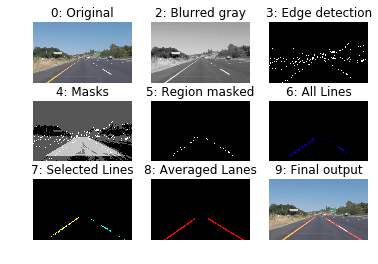

 24%|██▍       | 163/682 [28:26<1:30:40, 10.48s/it]

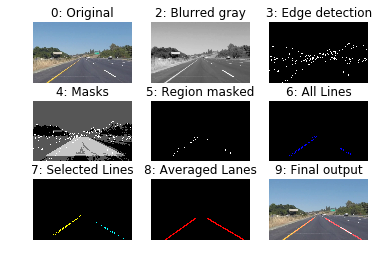

 24%|██▍       | 164/682 [28:36<1:30:17, 10.46s/it]

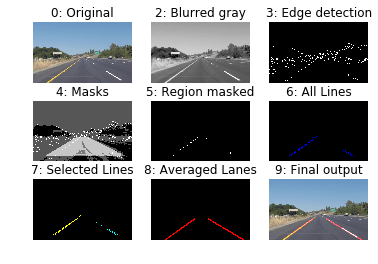

 24%|██▍       | 165/682 [28:47<1:30:04, 10.45s/it]

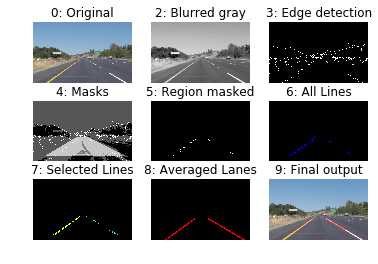

 24%|██▍       | 166/682 [28:57<1:29:58, 10.46s/it]

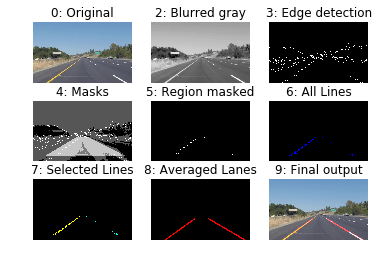

 24%|██▍       | 167/682 [29:08<1:29:47, 10.46s/it]

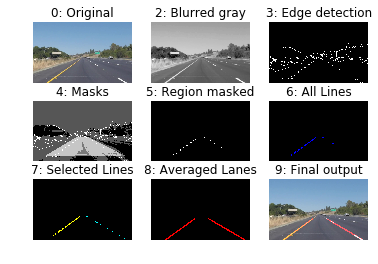

 25%|██▍       | 168/682 [29:18<1:29:27, 10.44s/it]

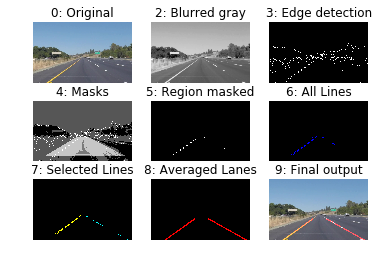

 25%|██▍       | 169/682 [29:29<1:29:03, 10.42s/it]

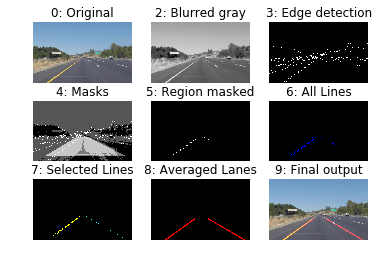

 25%|██▍       | 170/682 [29:39<1:28:59, 10.43s/it]

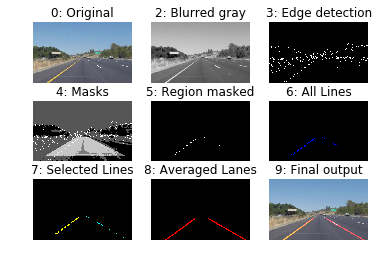

 25%|██▌       | 171/682 [29:49<1:28:47, 10.42s/it]

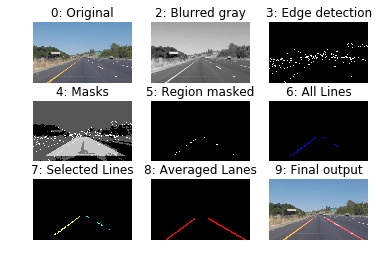

 25%|██▌       | 172/682 [30:00<1:29:17, 10.50s/it]

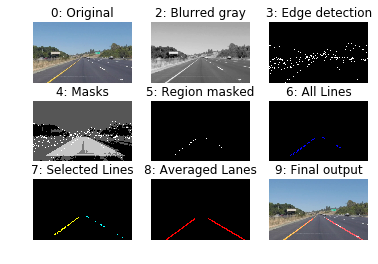

 25%|██▌       | 173/682 [30:10<1:28:40, 10.45s/it]

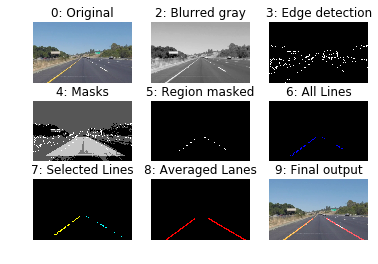

 26%|██▌       | 174/682 [30:21<1:28:36, 10.46s/it]

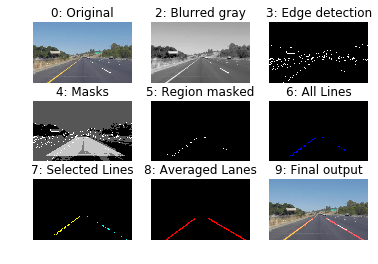

 26%|██▌       | 175/682 [30:31<1:28:20, 10.45s/it]

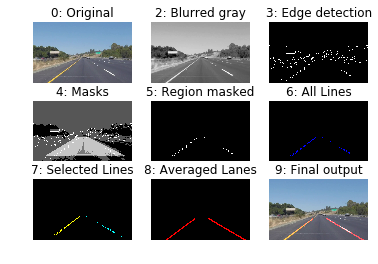

 26%|██▌       | 176/682 [30:42<1:28:31, 10.50s/it]

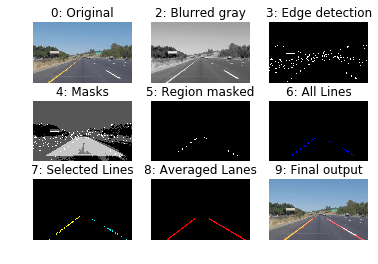

 26%|██▌       | 177/682 [30:53<1:28:31, 10.52s/it]

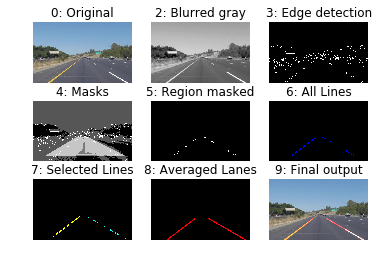

 26%|██▌       | 178/682 [31:03<1:28:06, 10.49s/it]

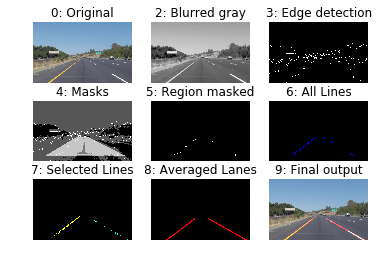

 26%|██▌       | 179/682 [31:13<1:27:58, 10.49s/it]

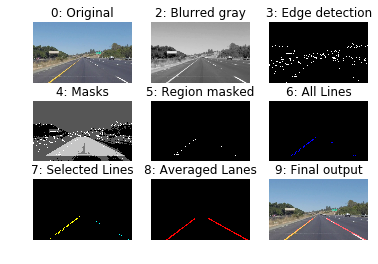

 26%|██▋       | 180/682 [31:24<1:27:39, 10.48s/it]

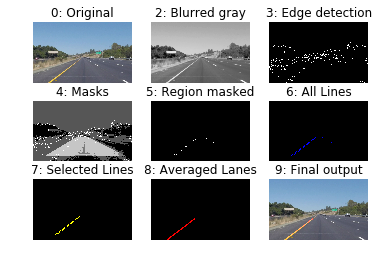

 27%|██▋       | 181/682 [31:35<1:28:03, 10.55s/it]

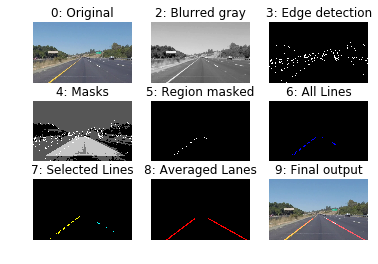

 27%|██▋       | 182/682 [31:45<1:27:42, 10.52s/it]

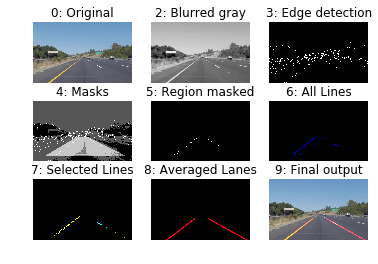

 27%|██▋       | 183/682 [31:56<1:29:05, 10.71s/it]

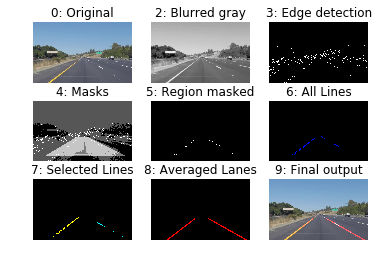

 27%|██▋       | 184/682 [32:07<1:28:50, 10.70s/it]

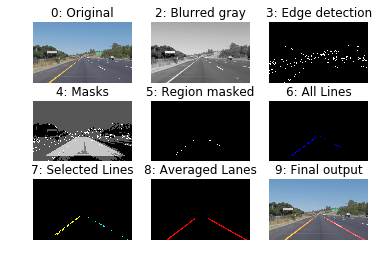

 27%|██▋       | 185/682 [32:18<1:28:55, 10.74s/it]

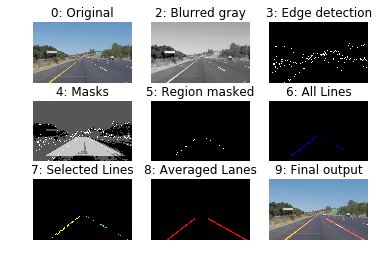

 27%|██▋       | 186/682 [32:28<1:28:15, 10.68s/it]

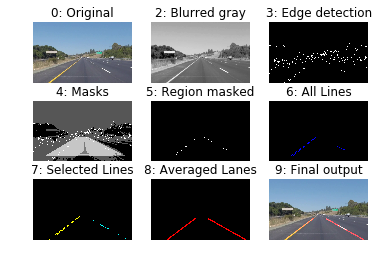

 27%|██▋       | 187/682 [32:39<1:28:00, 10.67s/it]

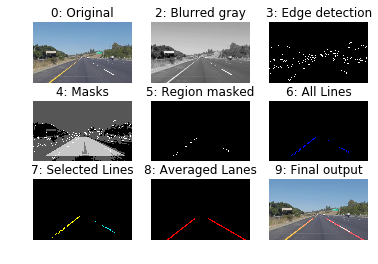

 28%|██▊       | 188/682 [32:50<1:28:16, 10.72s/it]

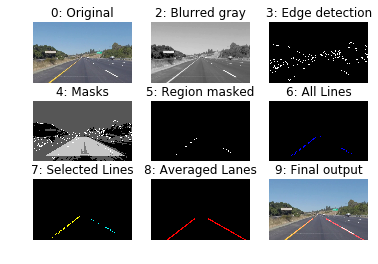

 28%|██▊       | 189/682 [33:00<1:27:42, 10.68s/it]

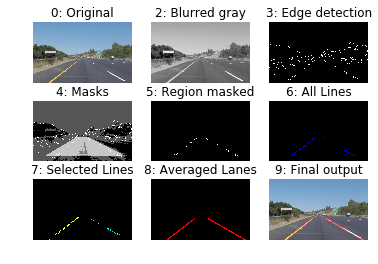

 28%|██▊       | 190/682 [33:11<1:27:16, 10.64s/it]

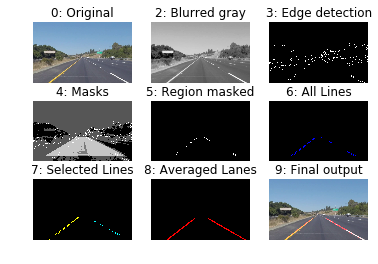

 28%|██▊       | 191/682 [33:22<1:27:17, 10.67s/it]

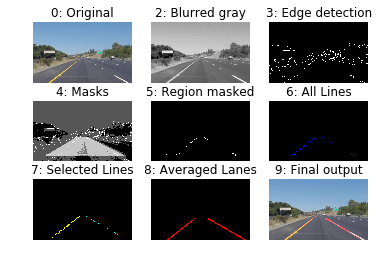

 28%|██▊       | 192/682 [33:32<1:27:23, 10.70s/it]

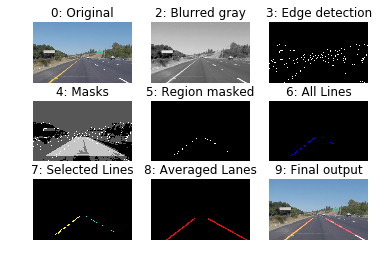

 28%|██▊       | 193/682 [33:43<1:27:15, 10.71s/it]

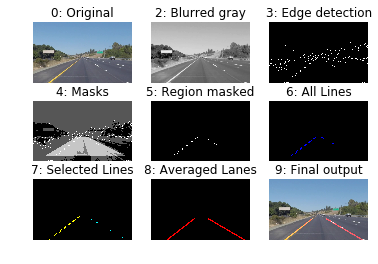

 28%|██▊       | 194/682 [33:54<1:27:52, 10.80s/it]

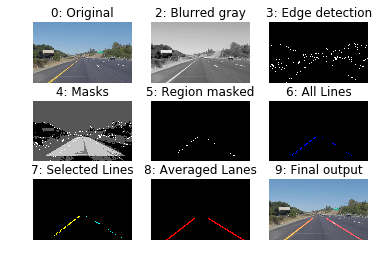

 29%|██▊       | 195/682 [34:05<1:28:02, 10.85s/it]

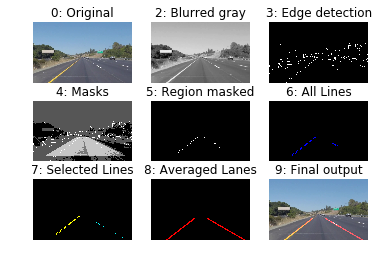

 29%|██▊       | 196/682 [34:16<1:28:00, 10.87s/it]

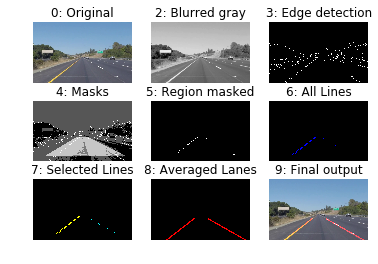

 29%|██▉       | 197/682 [34:26<1:26:52, 10.75s/it]

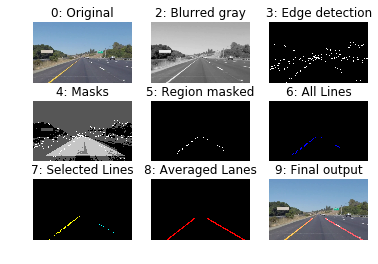

 29%|██▉       | 198/682 [34:37<1:26:29, 10.72s/it]

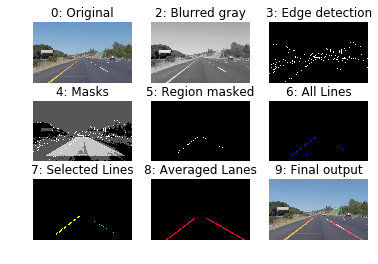

 29%|██▉       | 199/682 [34:48<1:25:58, 10.68s/it]

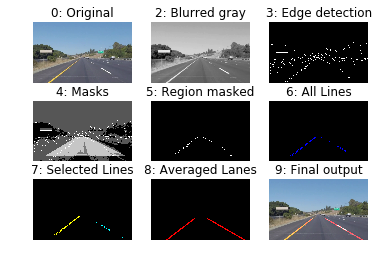

 29%|██▉       | 200/682 [34:58<1:24:53, 10.57s/it]

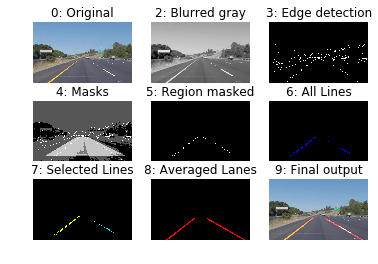

 29%|██▉       | 201/682 [35:08<1:24:22, 10.53s/it]

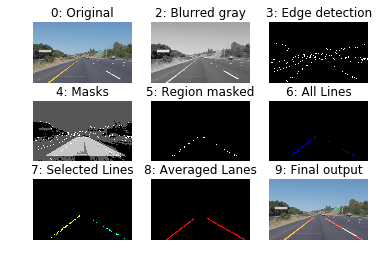

 30%|██▉       | 202/682 [35:19<1:23:52, 10.48s/it]

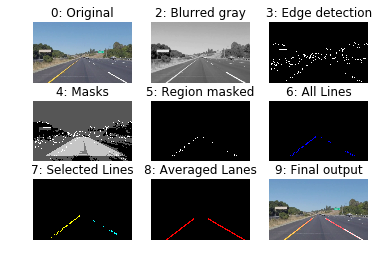

 30%|██▉       | 203/682 [35:29<1:23:33, 10.47s/it]

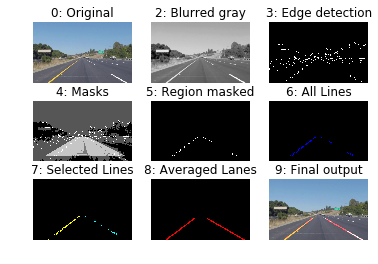

 30%|██▉       | 204/682 [35:40<1:23:04, 10.43s/it]

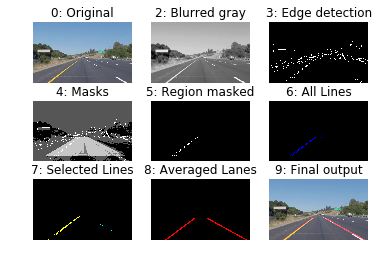

 30%|███       | 205/682 [35:50<1:23:22, 10.49s/it]

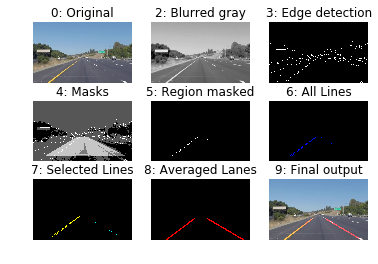

 30%|███       | 206/682 [36:01<1:22:57, 10.46s/it]

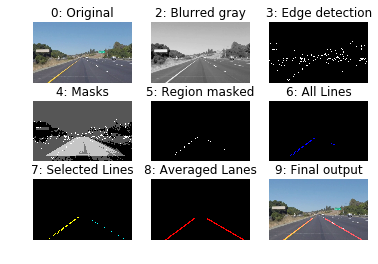

 30%|███       | 207/682 [36:11<1:23:02, 10.49s/it]

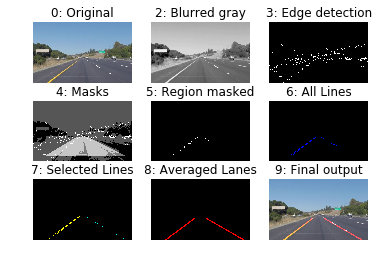

 30%|███       | 208/682 [36:22<1:23:44, 10.60s/it]

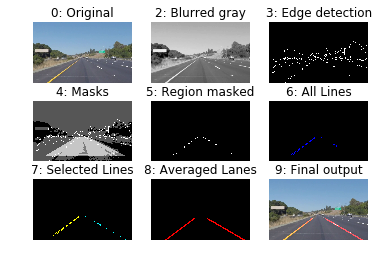

 31%|███       | 209/682 [36:33<1:23:17, 10.57s/it]

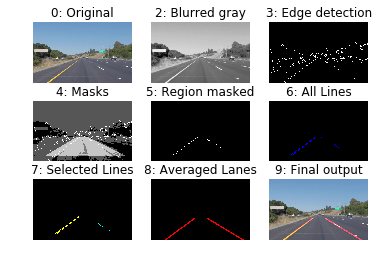

 31%|███       | 210/682 [36:43<1:22:54, 10.54s/it]

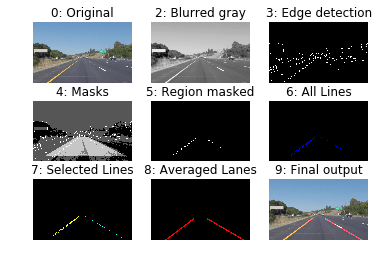

 31%|███       | 211/682 [36:54<1:24:45, 10.80s/it]

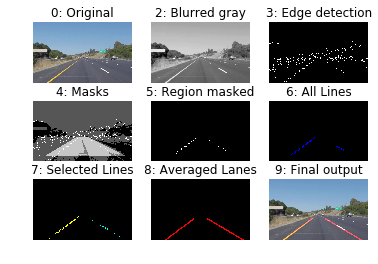

 31%|███       | 212/682 [37:06<1:25:35, 10.93s/it]

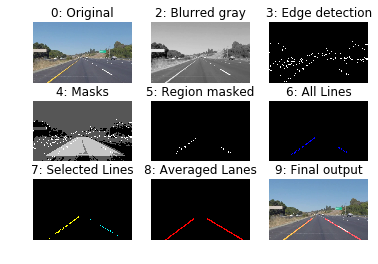

 31%|███       | 213/682 [37:16<1:24:10, 10.77s/it]

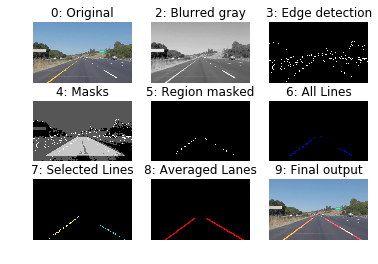

 31%|███▏      | 214/682 [37:27<1:24:03, 10.78s/it]

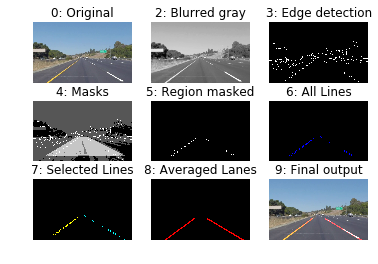

 32%|███▏      | 215/682 [37:37<1:23:22, 10.71s/it]

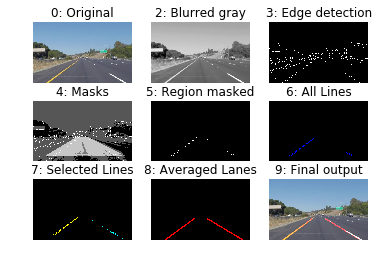

 32%|███▏      | 216/682 [37:48<1:23:40, 10.77s/it]

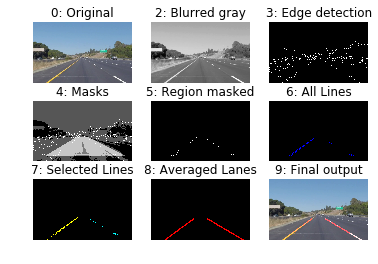

 32%|███▏      | 217/682 [37:59<1:22:25, 10.64s/it]

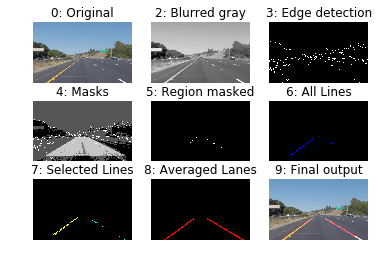

 32%|███▏      | 218/682 [38:09<1:21:37, 10.56s/it]

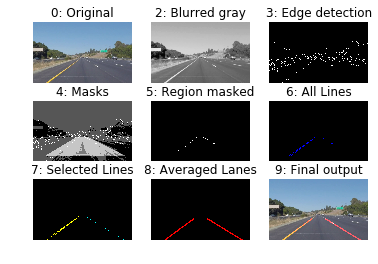

 32%|███▏      | 219/682 [38:19<1:20:58, 10.49s/it]

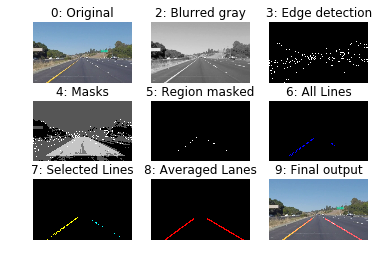

 32%|███▏      | 220/682 [38:30<1:20:30, 10.46s/it]

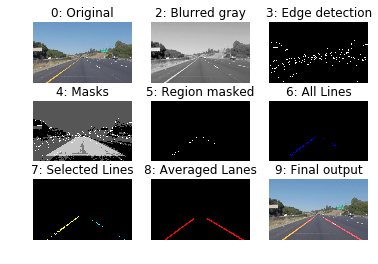

 32%|███▏      | 221/682 [38:40<1:20:12, 10.44s/it]

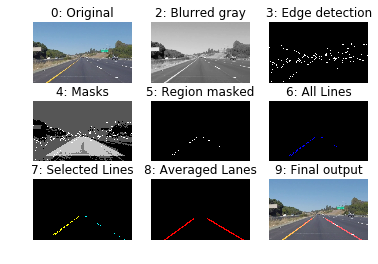

 33%|███▎      | 222/682 [38:51<1:20:25, 10.49s/it]

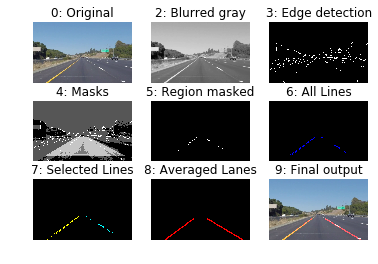

 33%|███▎      | 223/682 [39:01<1:20:26, 10.51s/it]

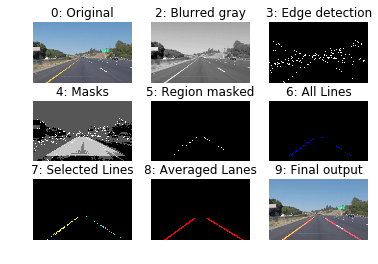

 33%|███▎      | 224/682 [39:12<1:20:12, 10.51s/it]

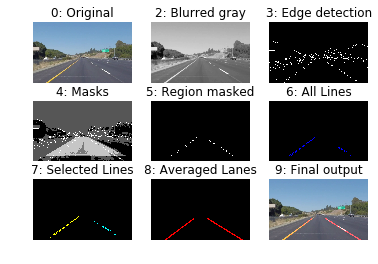

 33%|███▎      | 225/682 [39:22<1:19:53, 10.49s/it]

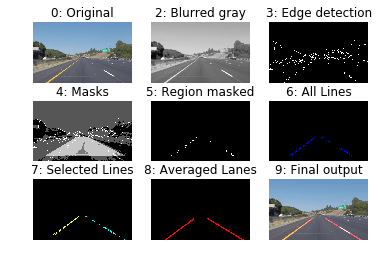

 33%|███▎      | 226/682 [39:33<1:19:53, 10.51s/it]

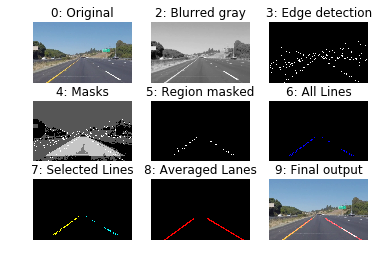

 33%|███▎      | 227/682 [39:43<1:19:38, 10.50s/it]

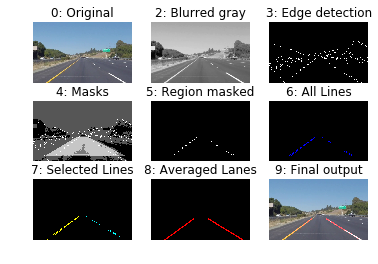

 33%|███▎      | 228/682 [39:54<1:19:40, 10.53s/it]

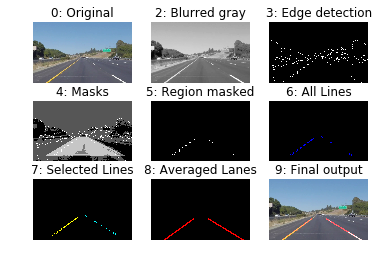

 34%|███▎      | 229/682 [40:04<1:19:19, 10.51s/it]

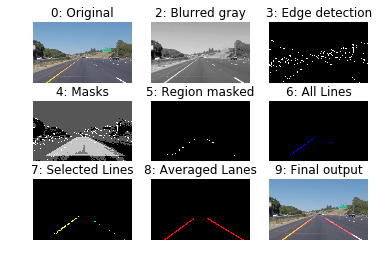

 34%|███▎      | 230/682 [40:15<1:18:45, 10.45s/it]

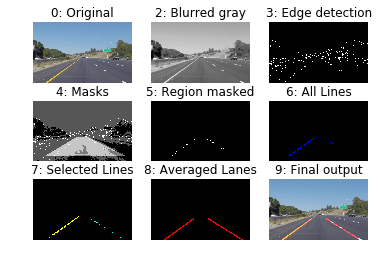

 34%|███▍      | 231/682 [40:25<1:18:52, 10.49s/it]

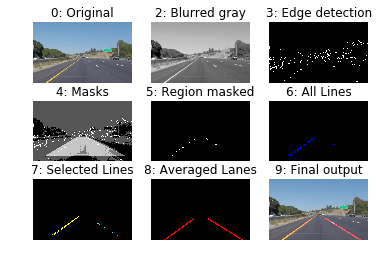

 34%|███▍      | 232/682 [40:36<1:18:54, 10.52s/it]

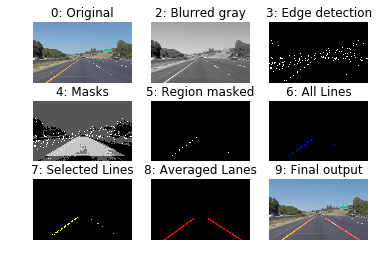

 34%|███▍      | 233/682 [40:46<1:18:23, 10.48s/it]

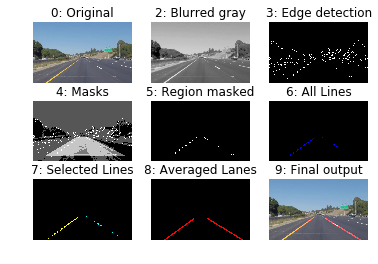

 34%|███▍      | 234/682 [40:57<1:18:16, 10.48s/it]

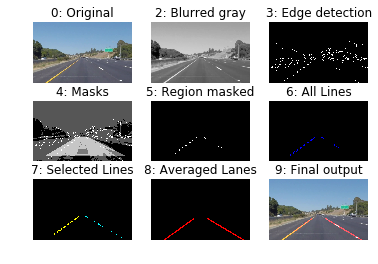

 34%|███▍      | 235/682 [41:07<1:18:04, 10.48s/it]

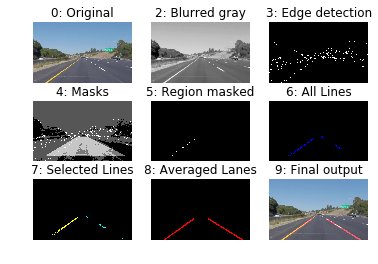

 35%|███▍      | 236/682 [41:18<1:18:15, 10.53s/it]

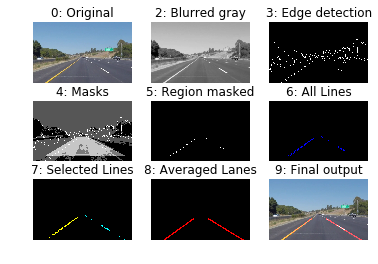

 35%|███▍      | 237/682 [41:28<1:18:04, 10.53s/it]

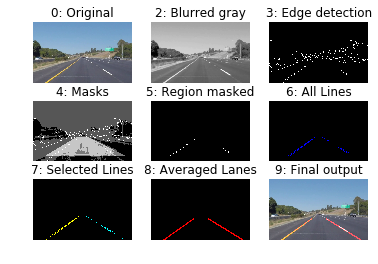

 35%|███▍      | 238/682 [41:39<1:17:47, 10.51s/it]

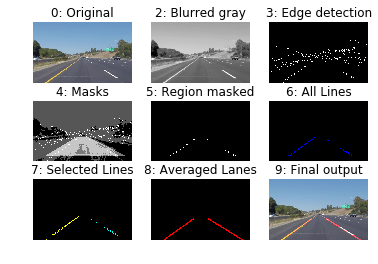

 35%|███▌      | 239/682 [41:50<1:18:18, 10.61s/it]

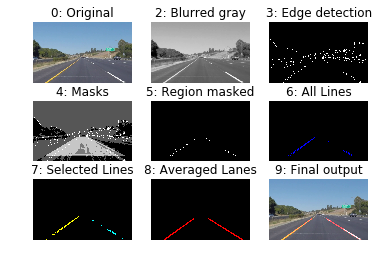

 35%|███▌      | 240/682 [42:00<1:18:33, 10.66s/it]

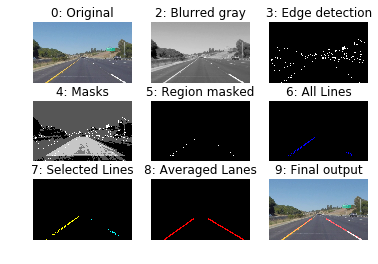

 35%|███▌      | 241/682 [42:11<1:18:18, 10.65s/it]

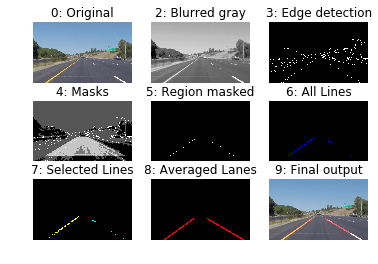

 35%|███▌      | 242/682 [42:22<1:18:07, 10.65s/it]

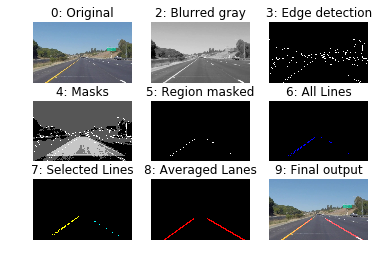

 36%|███▌      | 243/682 [42:32<1:17:49, 10.64s/it]

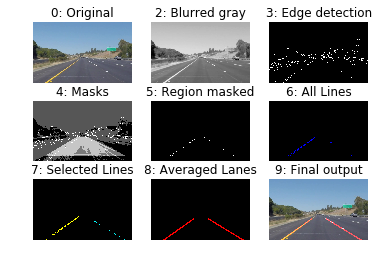

 36%|███▌      | 244/682 [42:43<1:17:20, 10.60s/it]

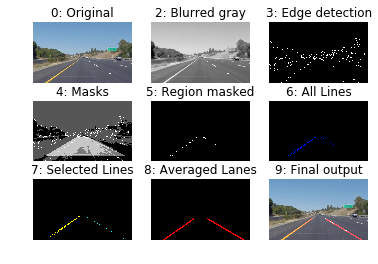

 36%|███▌      | 245/682 [42:53<1:17:20, 10.62s/it]

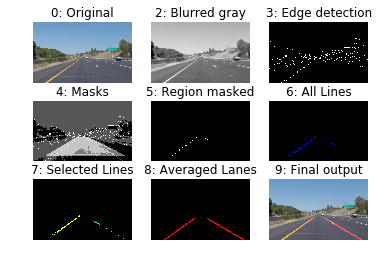

 36%|███▌      | 246/682 [43:04<1:17:06, 10.61s/it]

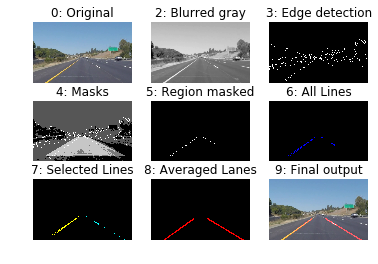

 36%|███▌      | 247/682 [43:15<1:17:16, 10.66s/it]

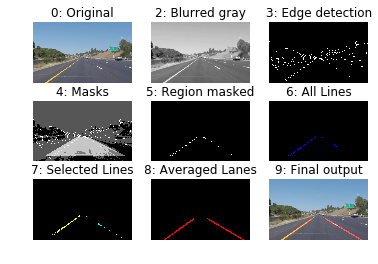

 36%|███▋      | 248/682 [43:25<1:16:56, 10.64s/it]

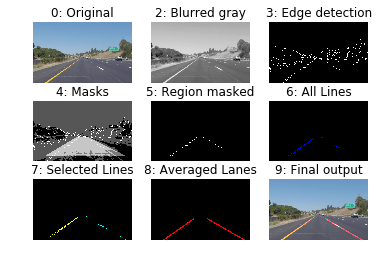

 37%|███▋      | 249/682 [43:36<1:17:03, 10.68s/it]

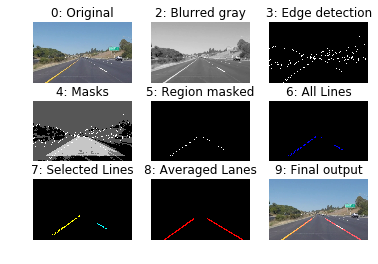

 37%|███▋      | 250/682 [43:47<1:16:27, 10.62s/it]

SystemError: <built-in method write of _io.BufferedWriter object at 0x7ffa0427a728> returned a result with an error set

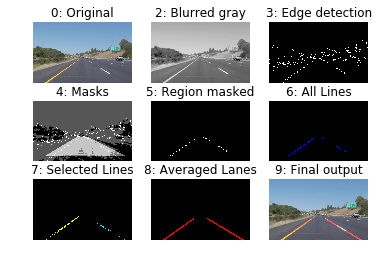

In [16]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image_challenge)
%time yellow_clip.write_videofile(yellow_output, audio=False)

In [371]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

In [22]:
challenge_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(process_image_challenge)
%time challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge.mp4
[MoviePy] Writing video test_videos_output/challenge.mp4



100%|██████████| 251/251 [00:18<00:00, 13.77it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge.mp4 

CPU times: user 20.2 s, sys: 416 ms, total: 20.6 s
Wall time: 20 s


In [23]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))